# Imports

In [ ]:
%load_ext autoreload
%autoreload 2

import tensorflow as tf
import torchvision
import torch
import lightning.pytorch as pl

from sklearn.decomposition import PCA
from src.model.full_model import SubCellProtModel,SubCellProtModel_bce
from src.utils.data_handling_utils import initialize_datasets, Retrieval_Data
from src.utils.batch_run_utils import batch_call, get_cell_lines_of_interest, get_isoforms_of_interest, construct_embedding_df
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import os
import time
from enum import Enum
import pdb
import pickle as pk
import math
from src.dataset.dataset import SubCellDatset, DatasetType, CLASSES
from PIL import Image

import sklearn
import sklearn.ensemble
import sklearn.neighbors
import seaborn as sns

fig = plt.figure()

## File locations / hyperparameters

In [2]:
COLLECTION_NAME = "splice_isoform_dataset_cell_line_and_gene_split_full"

MODEL_CHECKPOINT='checkpoints/splice_isoform_dataset_cell_line_and_gene_split_full-epoch=01-val_combined_loss=0.18.ckpt'
# MODEL_CHECKPOINT='checkpoints/splice_isoform_dataset_cell_line_and_gene_split_full-epoch=04-val_combined_loss=0.20.ckpt'


## Preprocessing

In [9]:
train_dataset, val_dataset, test_dataset, get_data = initialize_datasets(COLLECTION_NAME,if_alphabetical=True)
loaded_model = SubCellProtModel().load_from_checkpoint(
    MODEL_CHECKPOINT,
    collection_name=COLLECTION_NAME,
    batch_size=32,
)


In [7]:
len(train_dataset)

340553

In [8]:
len(val_dataset)

11050

In [9]:
len(test_dataset)

25502

In [ ]:
X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain = train_dataset[0]
loaded_model.eval()
protein_latent_rep = loaded_model.light_attention_trunk(
            X_esm2_encoding.unsqueeze(0),torch.Tensor([X_protein_len])
        )
torch.onnx.export(loaded_model.cell_inpainting_unet, (torch.from_numpy(X_landmark_stains).unsqueeze(0),protein_latent_rep), 'plot.onnx')

In [6]:
lossMSE=torch.nn.MSELoss()
lossBCE=torch.nn.BCELoss()



In [9]:
len(CLASSES[0])

29

0


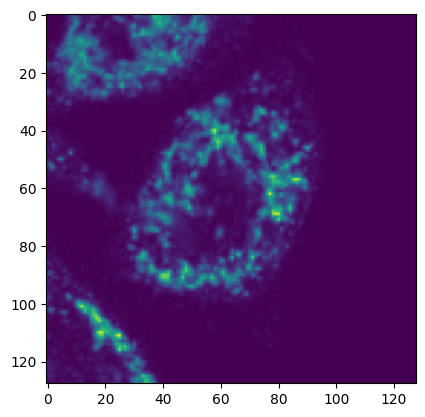

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


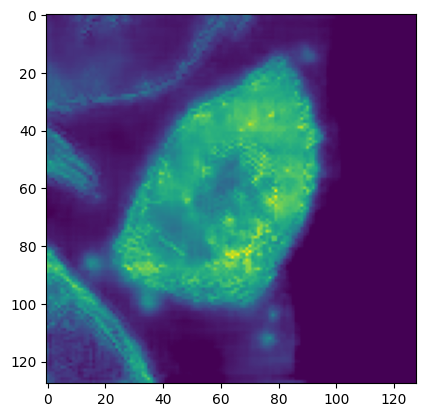

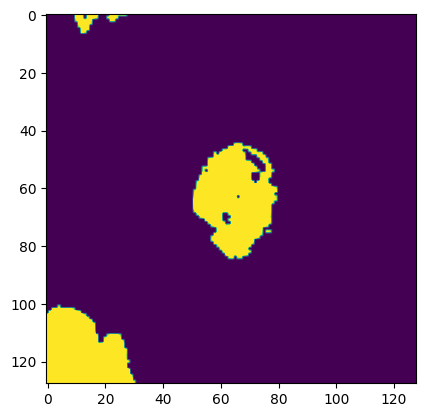

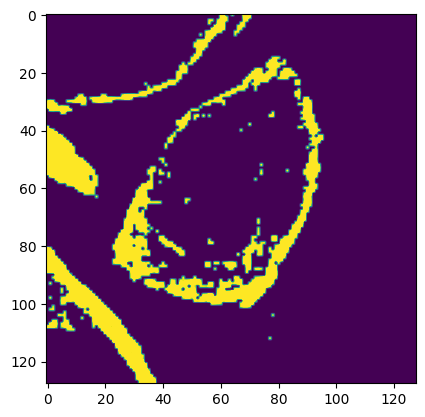

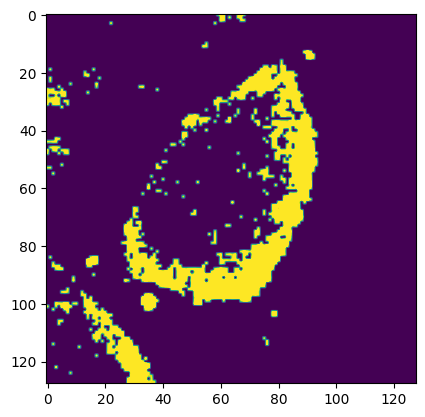

1


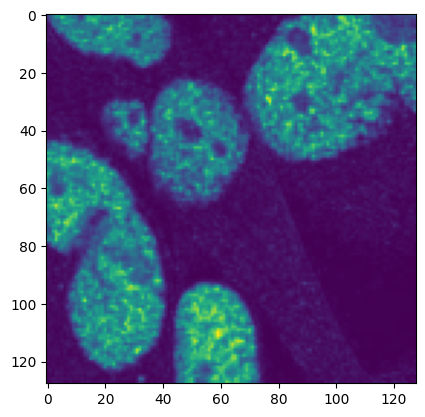

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


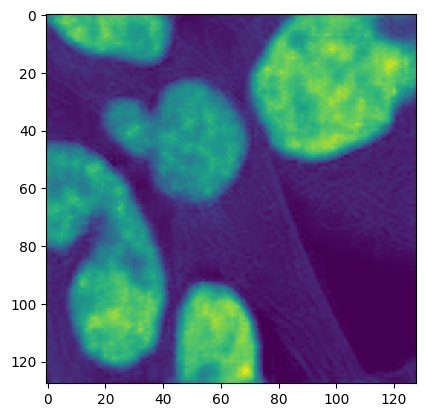

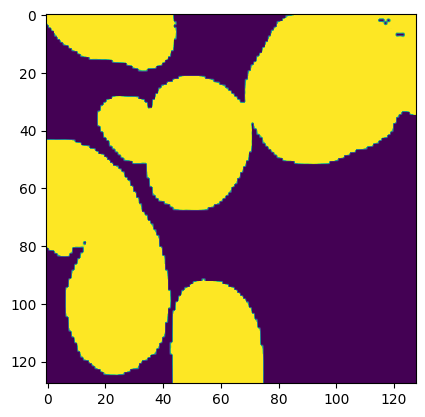

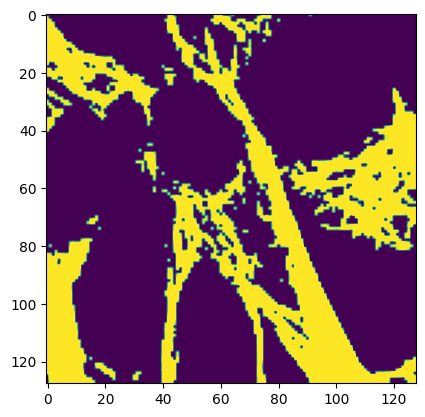

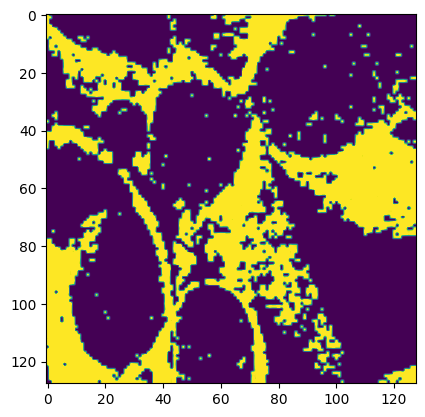

2


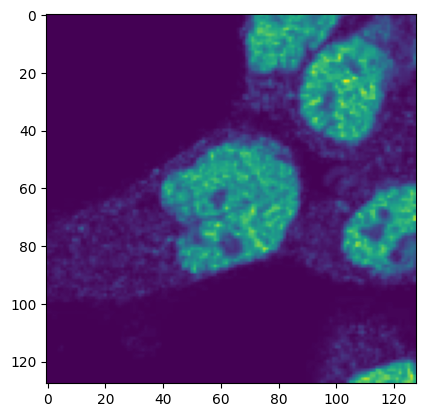

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


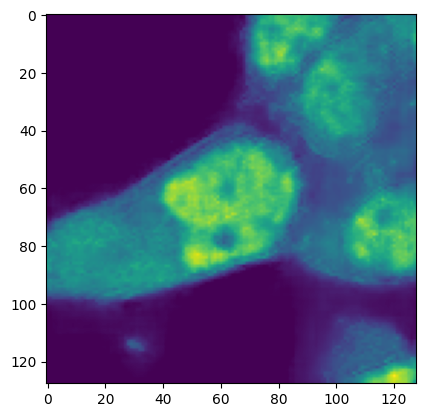

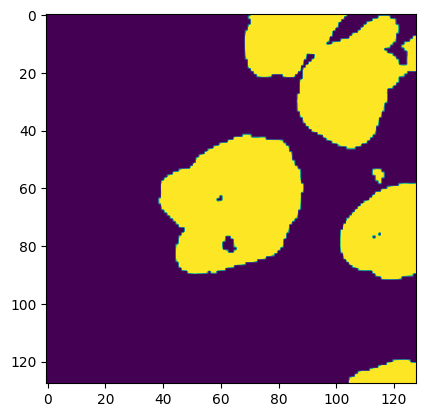

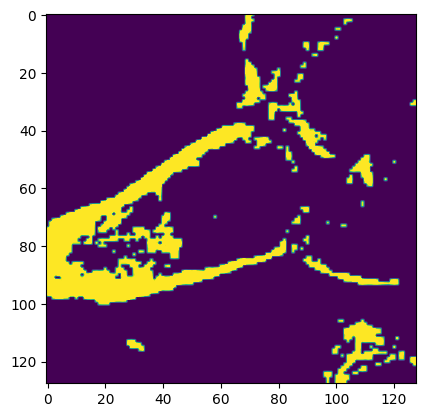

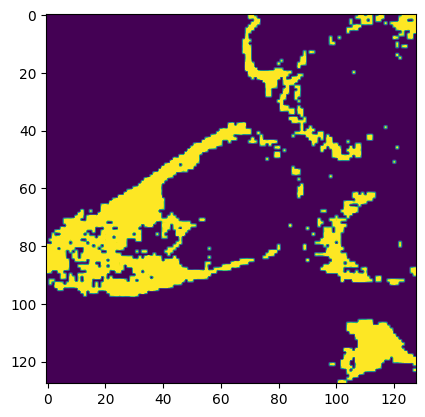

3


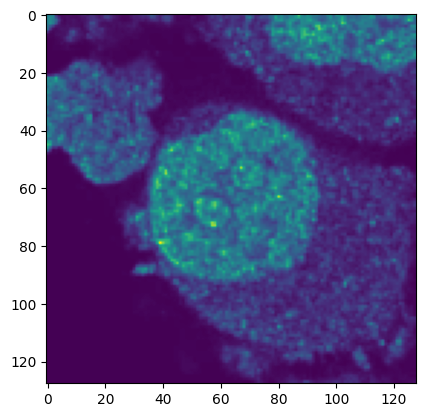

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


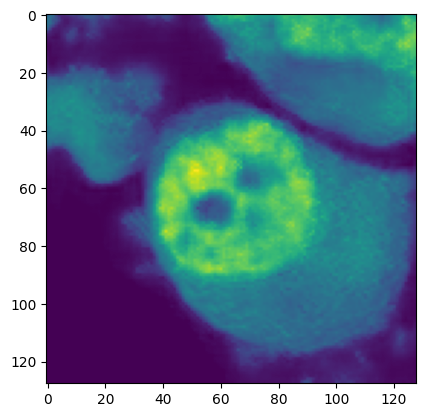

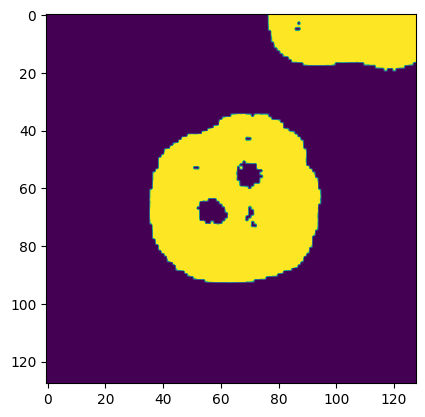

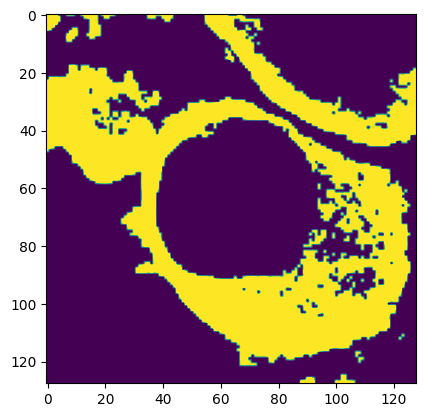

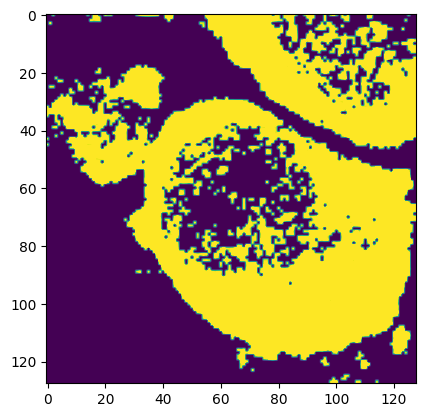

4


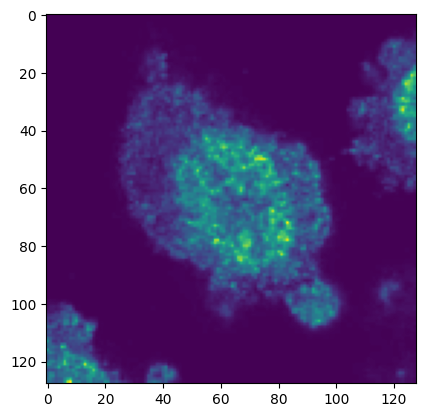

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


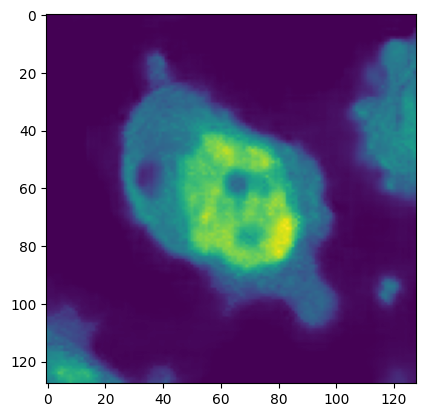

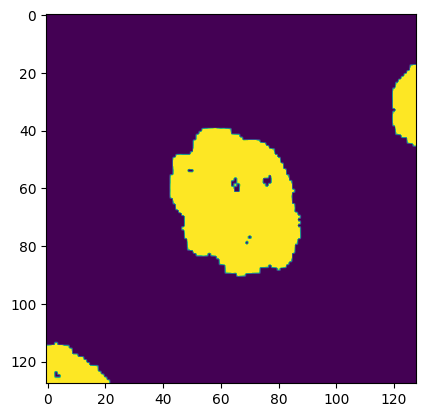

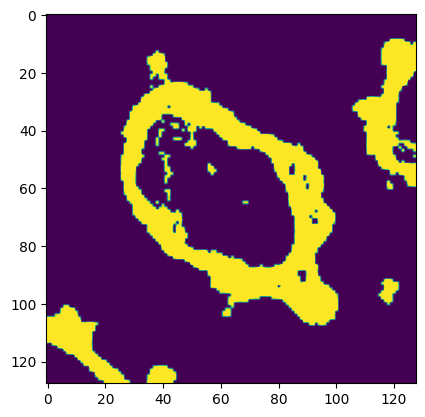

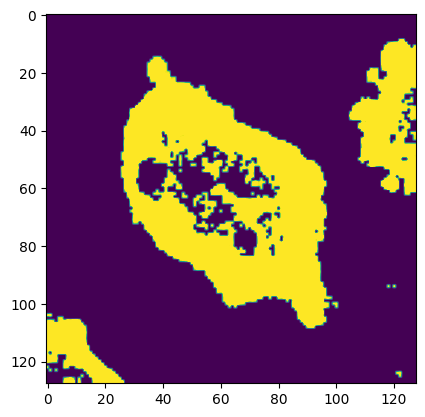

5


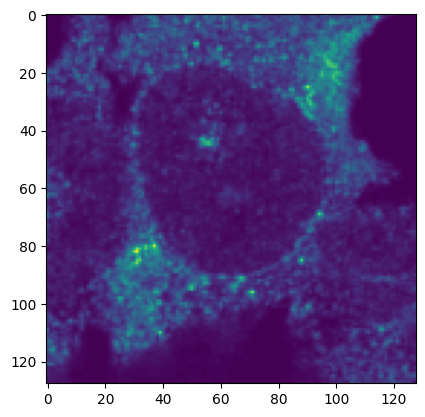

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


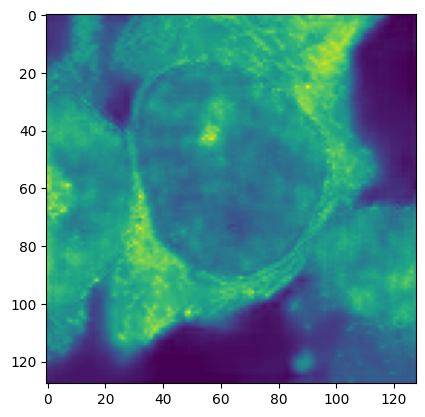

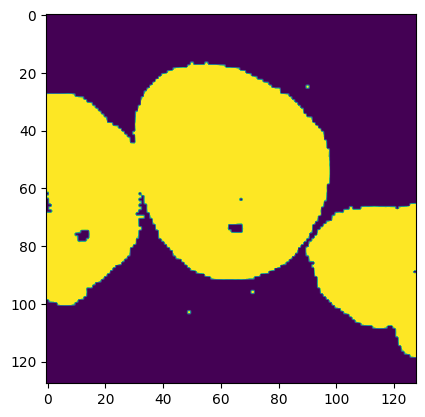

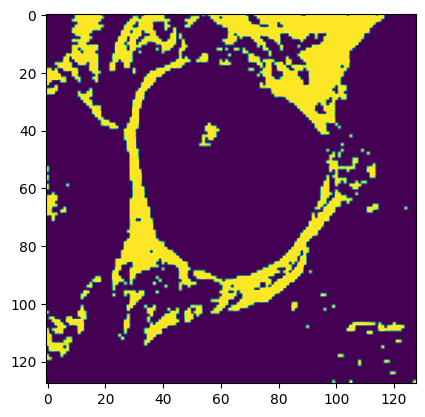

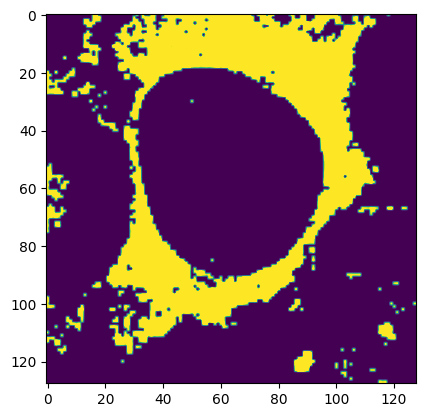

6


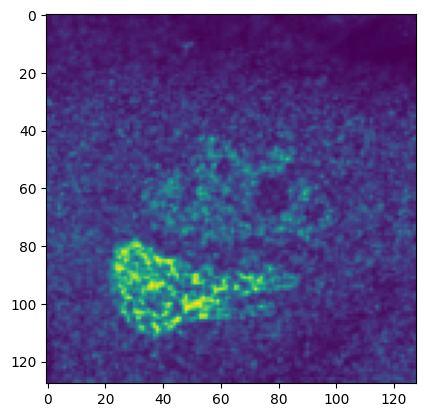

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


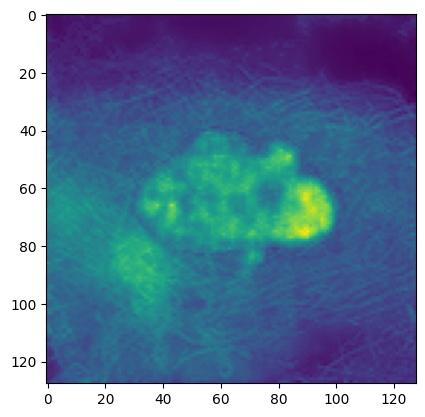

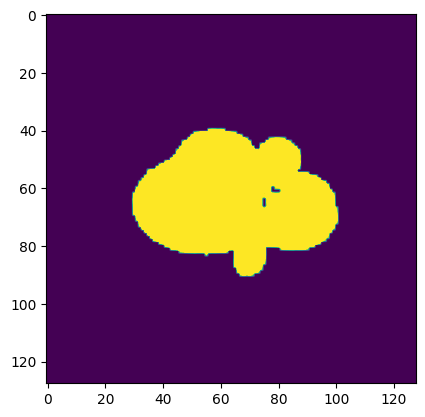

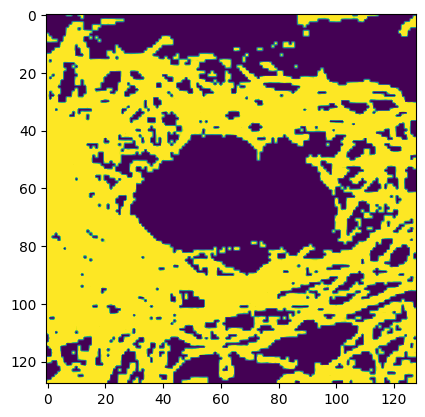

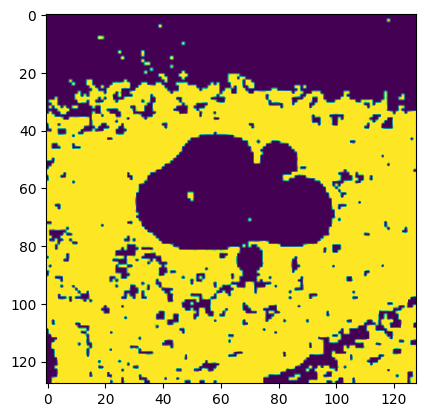

7


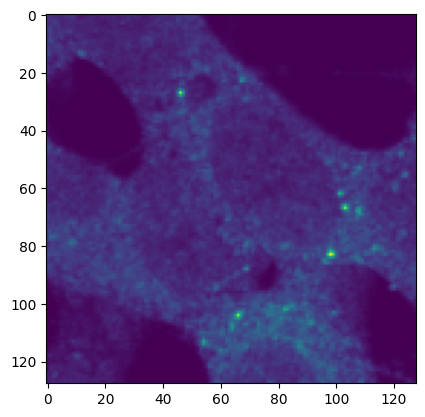

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


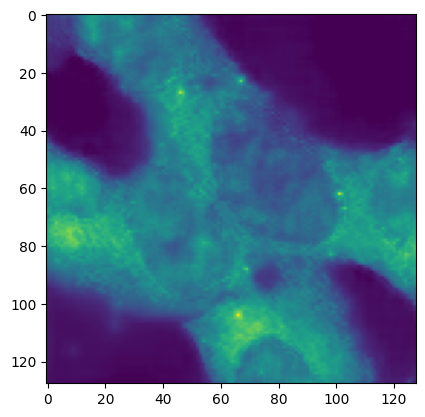

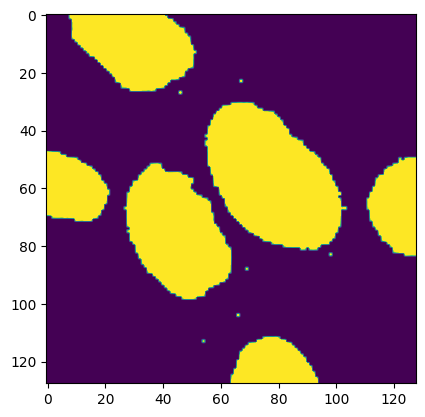

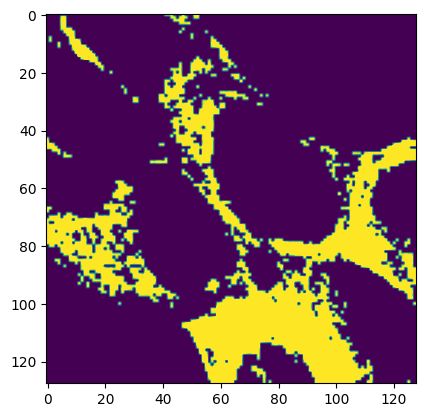

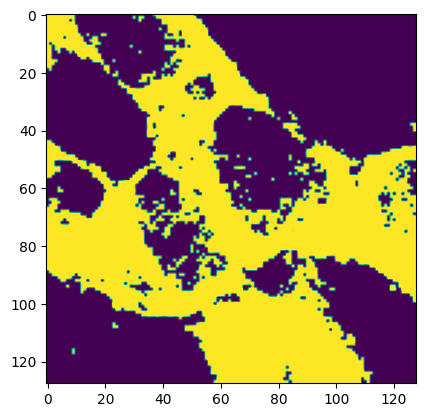

8


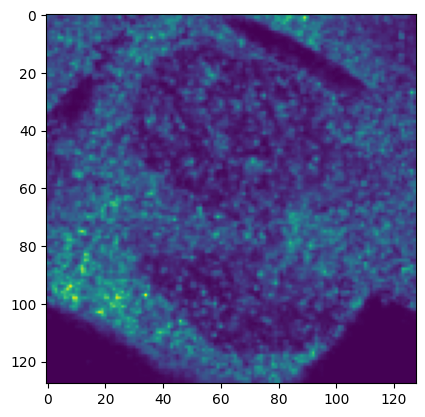

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


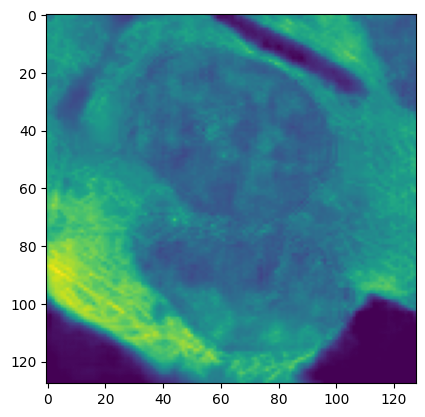

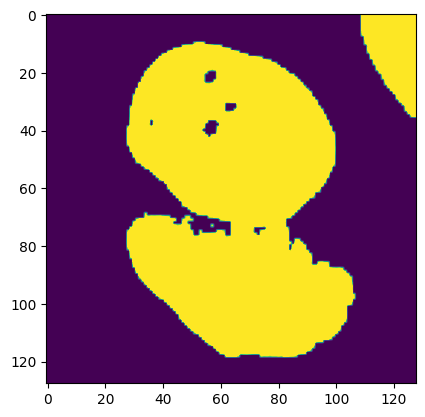

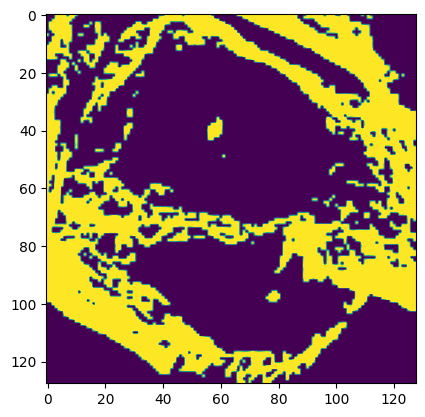

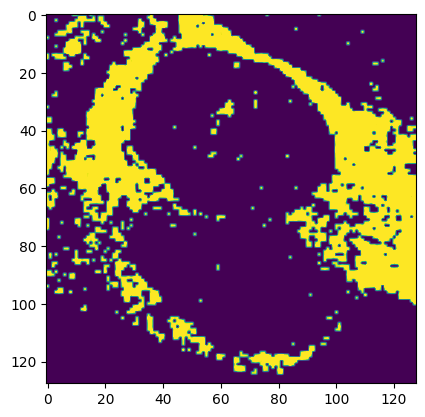

9


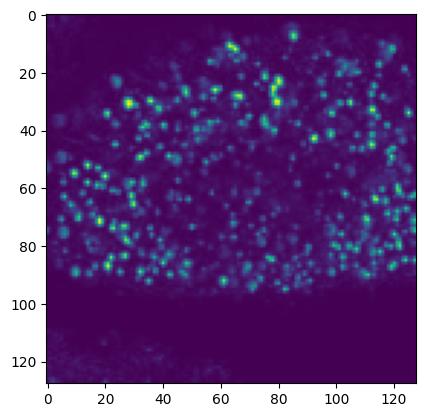

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


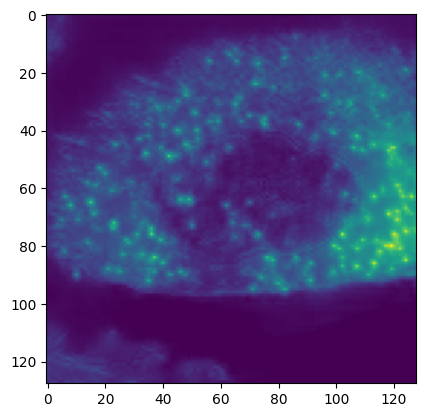

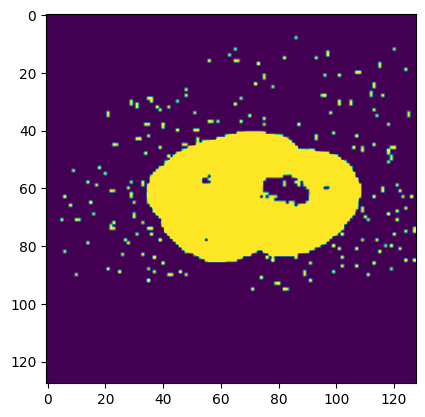

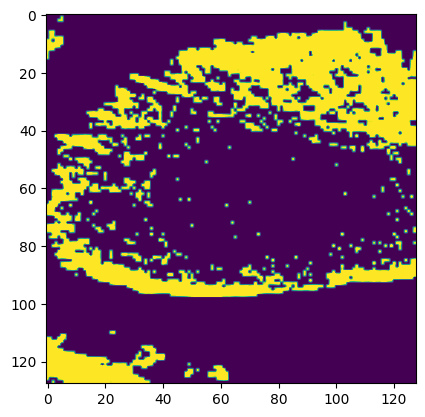

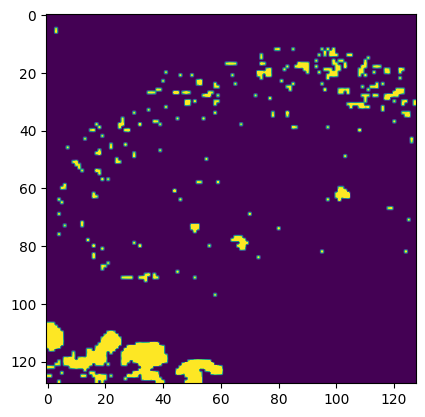

10


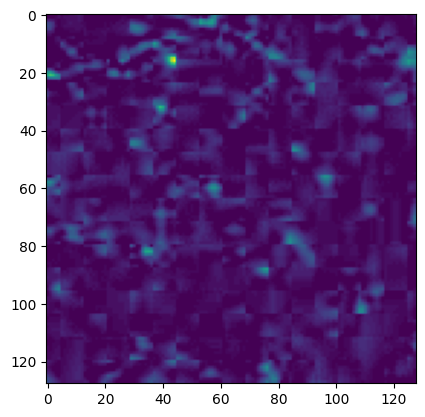

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


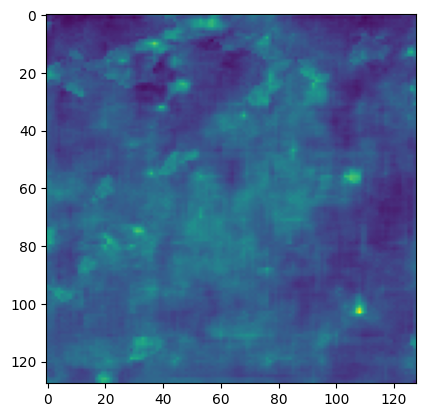

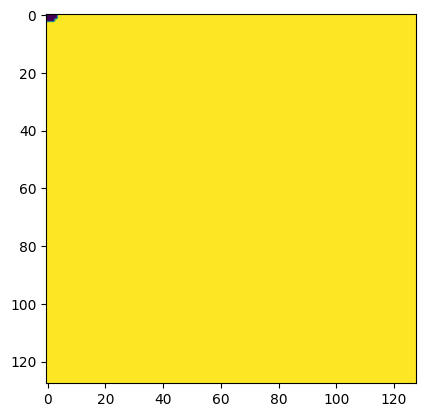

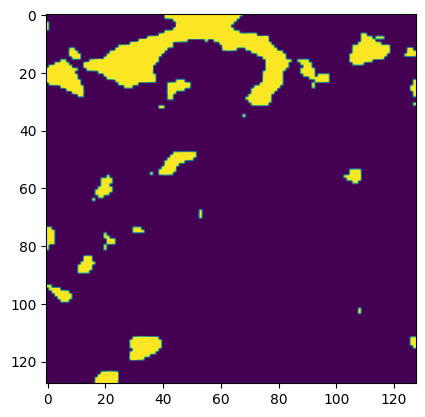

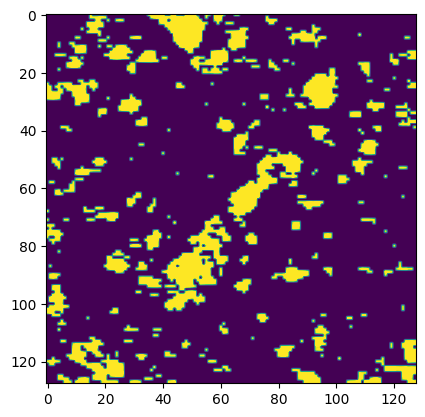

11


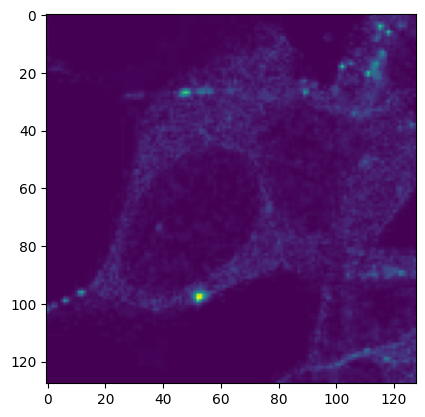

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


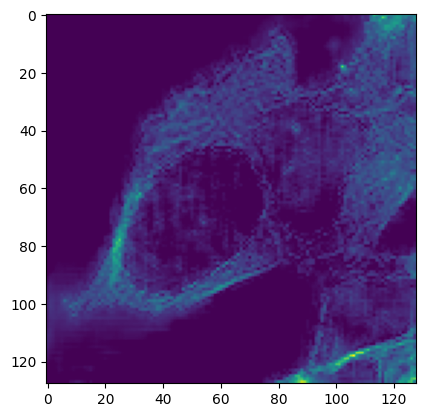

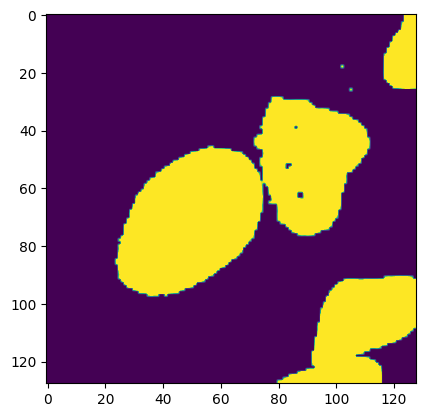

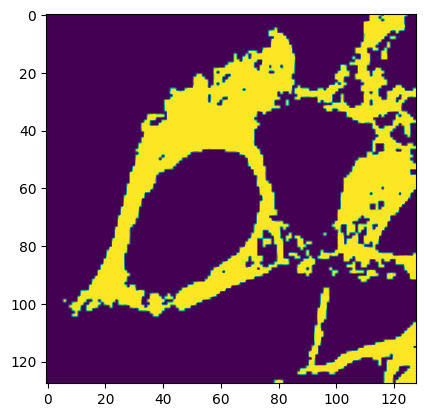

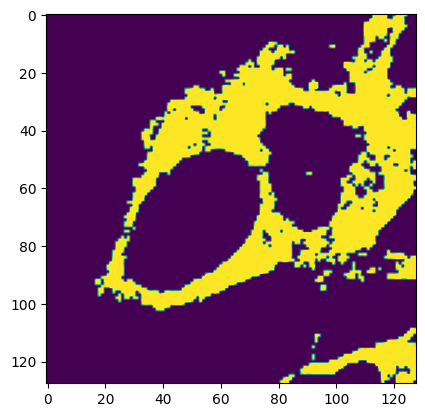

12


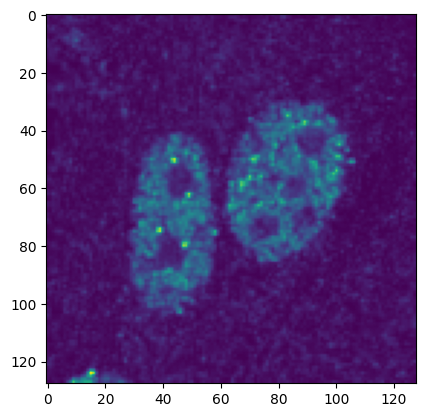

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


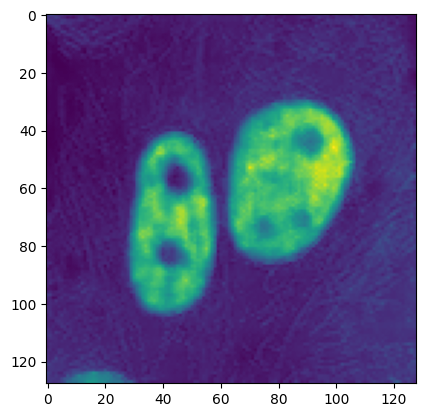

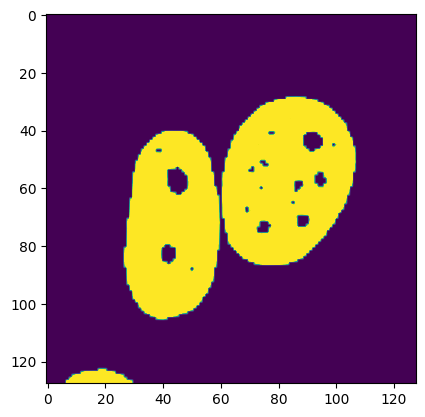

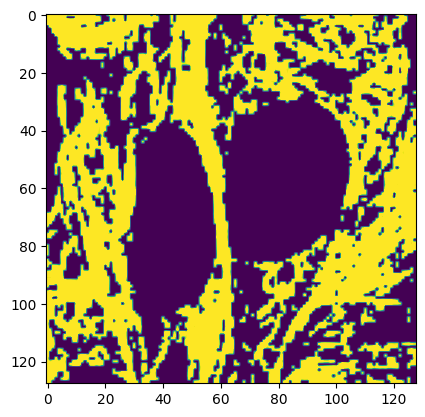

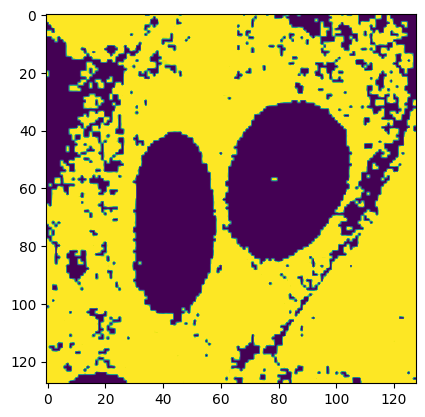

13


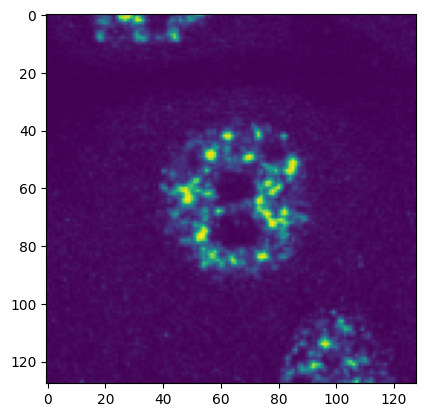

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


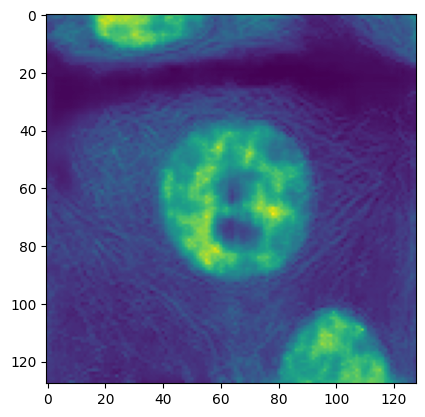

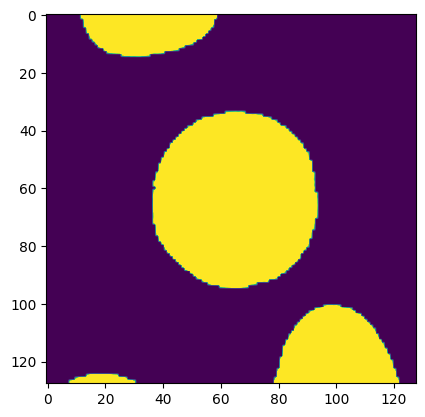

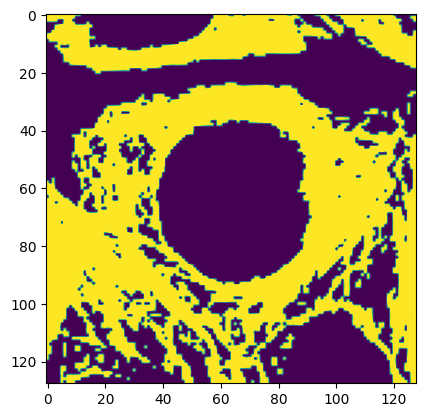

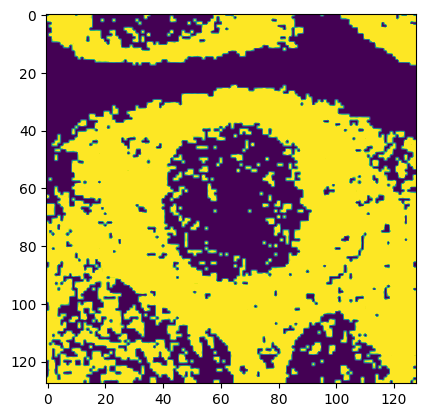

14


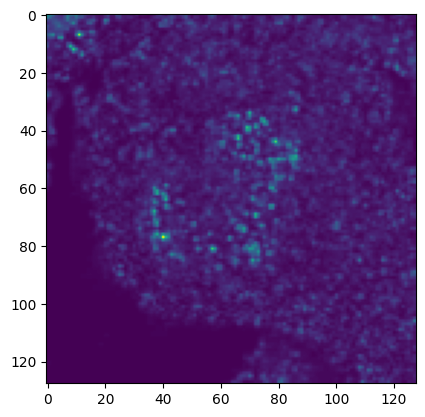

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


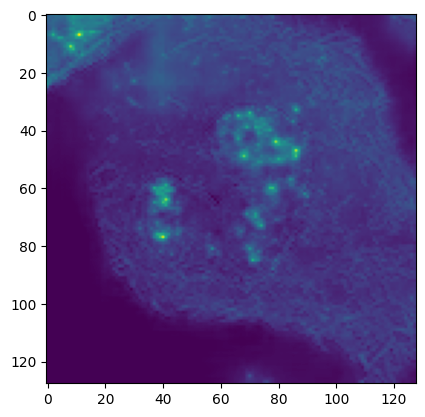

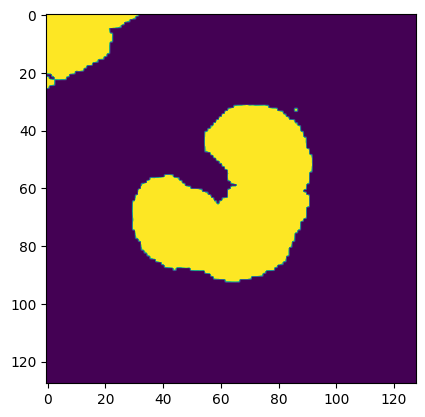

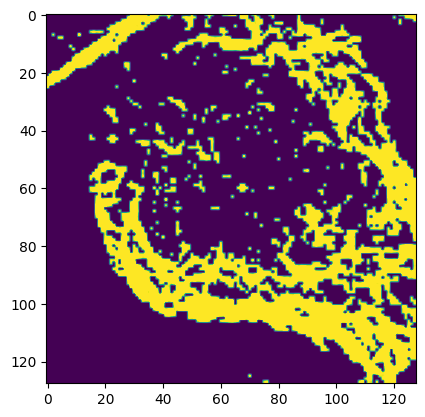

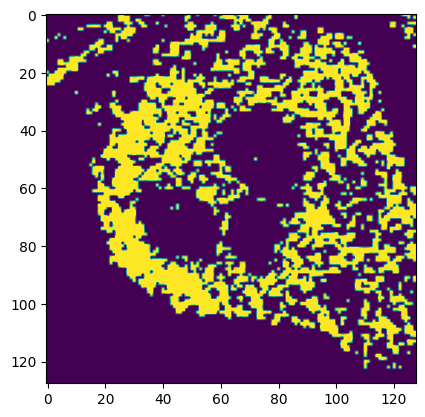

15


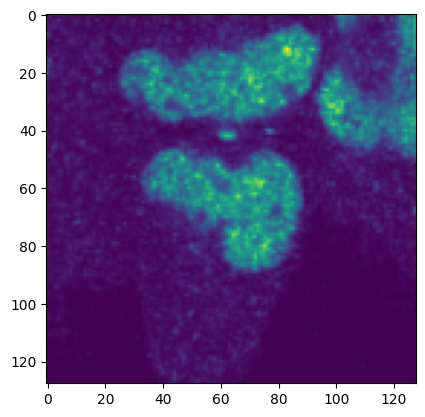

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


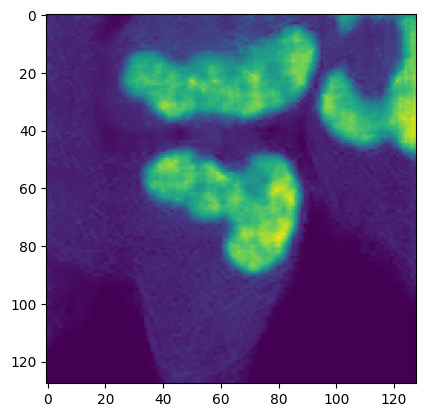

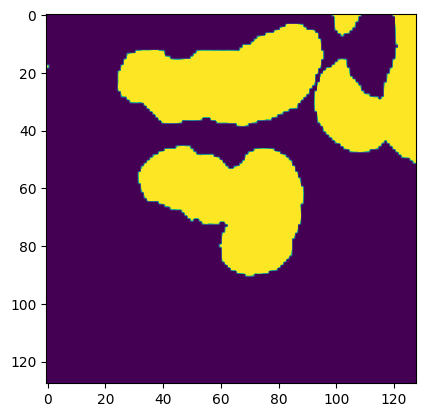

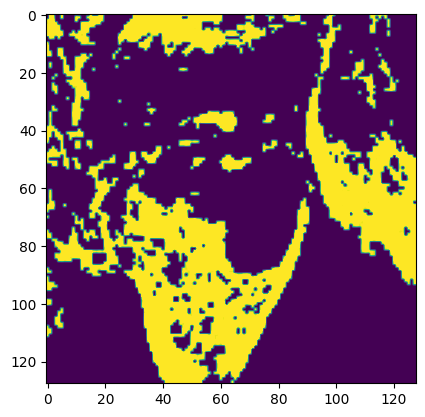

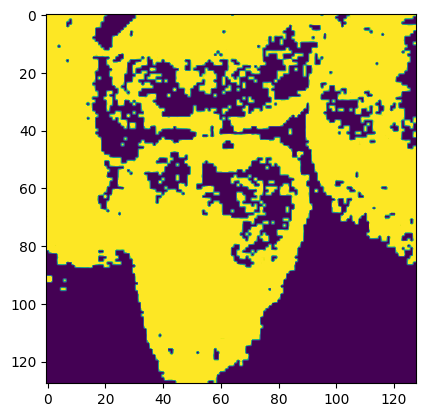

16


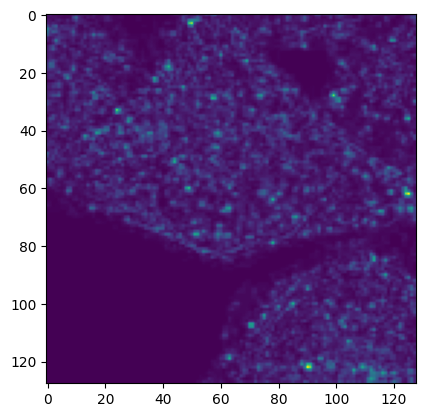

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


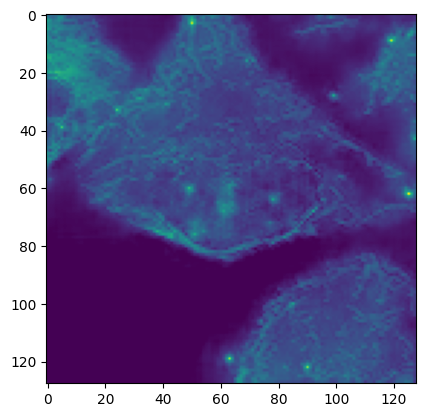

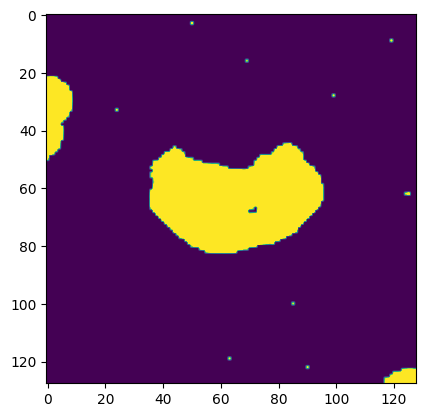

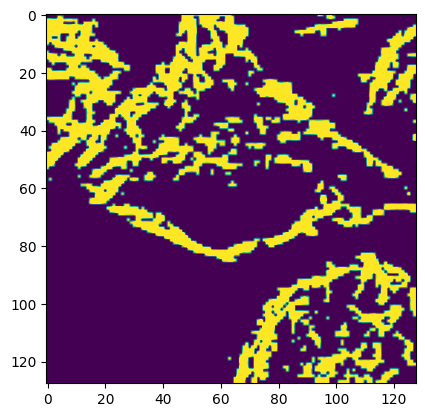

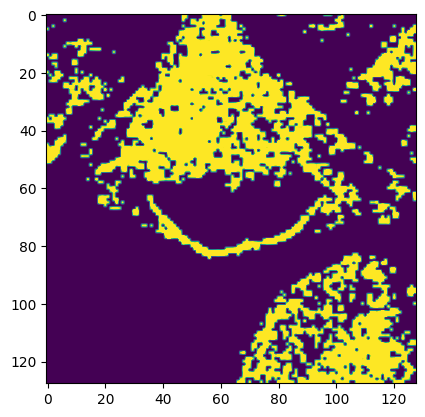

17


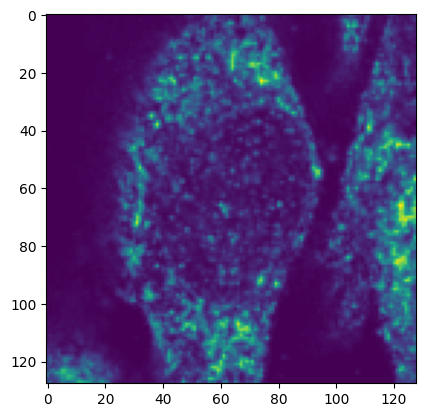

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


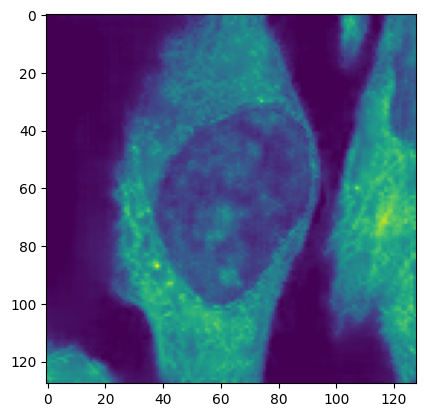

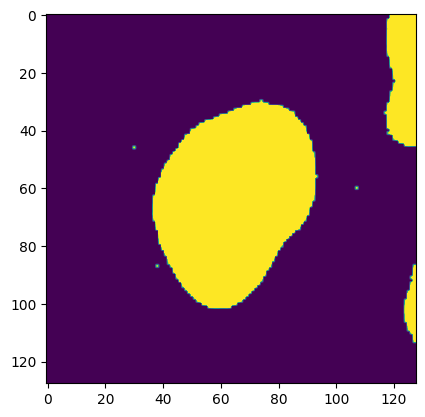

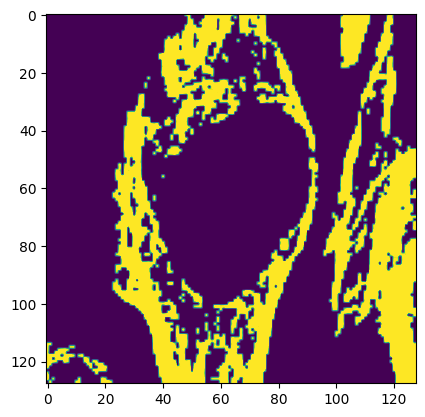

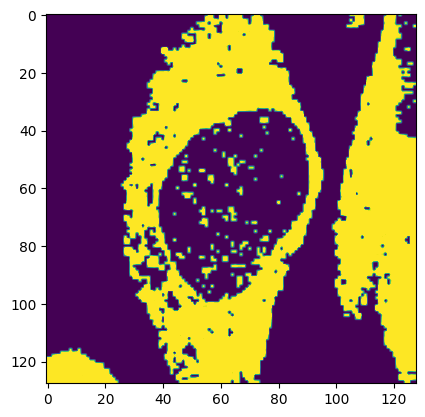

18


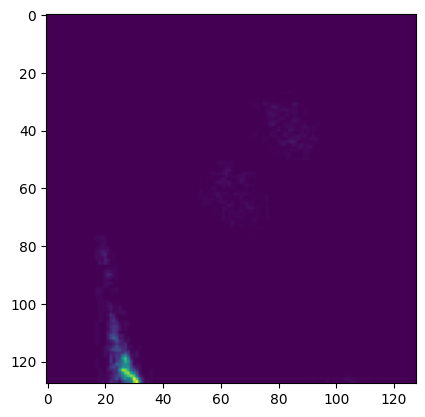

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


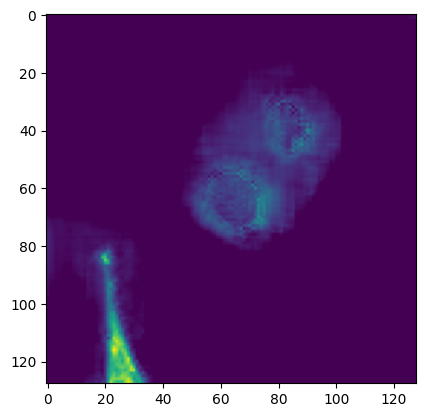

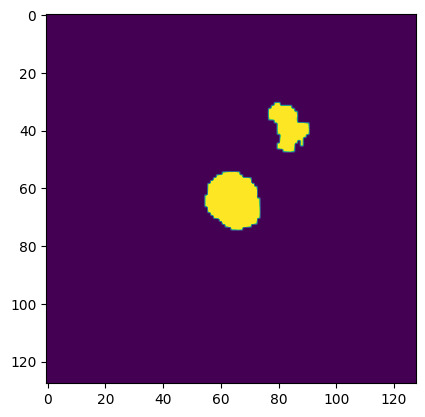

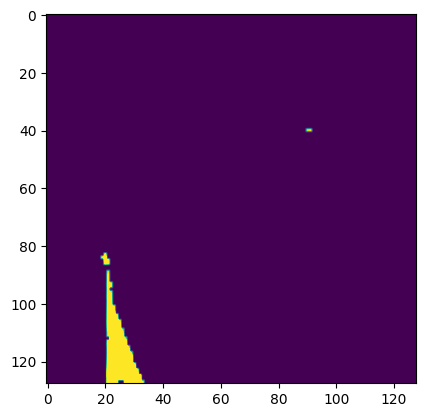

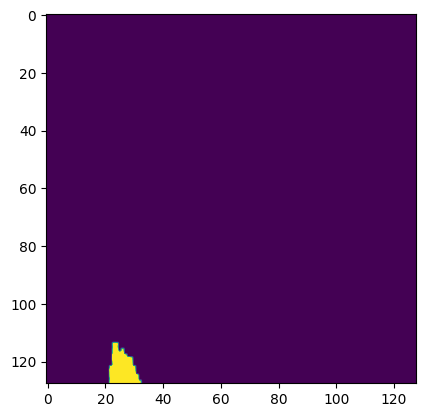

19


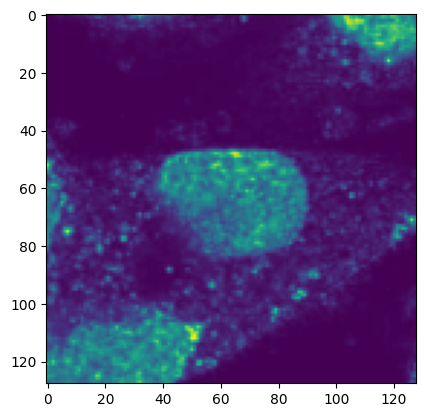

/tmp/ipykernel_2660516/983329902.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


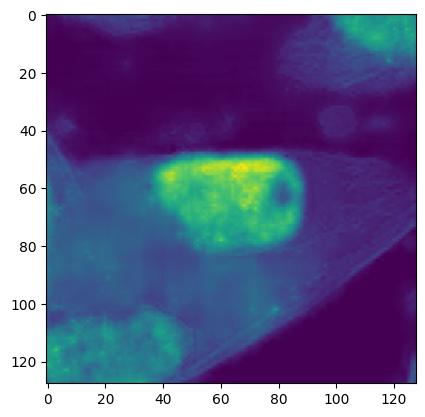

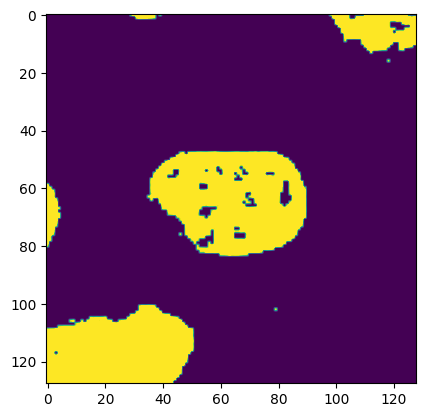

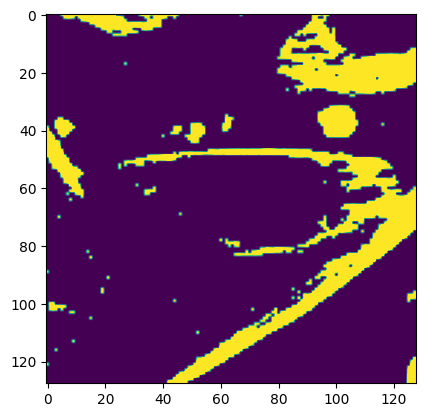

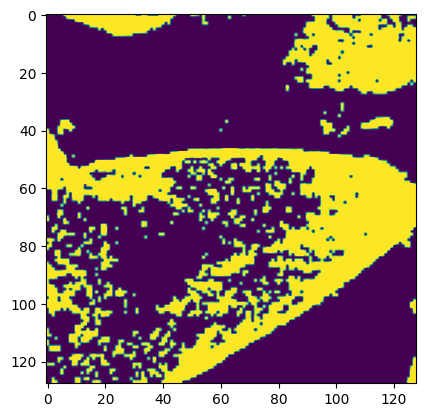

In [41]:
sigmoid=torch.nn.Sigmoid()
for i in range(20):
    print(i)
    X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[i]
    plt.imshow(y_antibody_stain)
    plt.show()
    with torch.no_grad():
        y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
            (
                X_esm2_encoding.unsqueeze(0),
                torch.Tensor([X_protein_len]),
                torch.from_numpy(X_landmark_stains).unsqueeze(0),
                None,
                None,
            ),
            batch_idx=0,
        )
    plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))
    plt.show()
    plt.imshow(X_landmark_stains[0],vmax=0.2)
    plt.show()
    plt.imshow(X_landmark_stains[1],vmax=0.2)
    plt.show()
    plt.imshow(X_landmark_stains[2],vmax=0.2)
    plt.show()

0


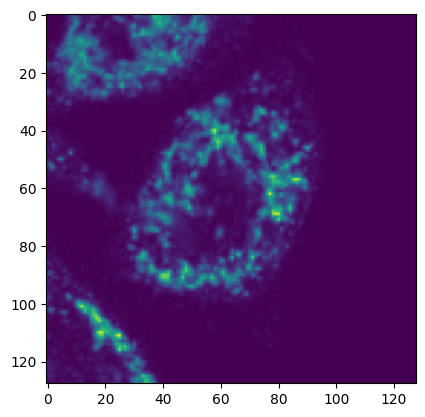

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


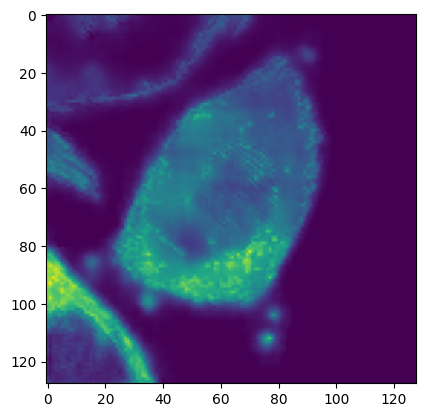

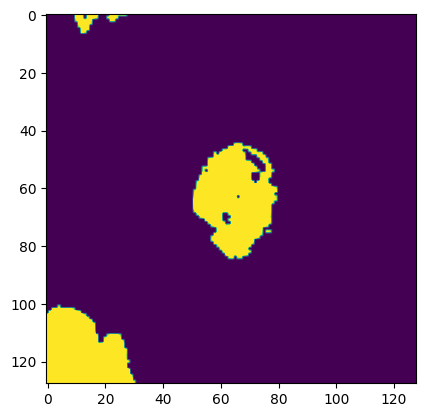

1


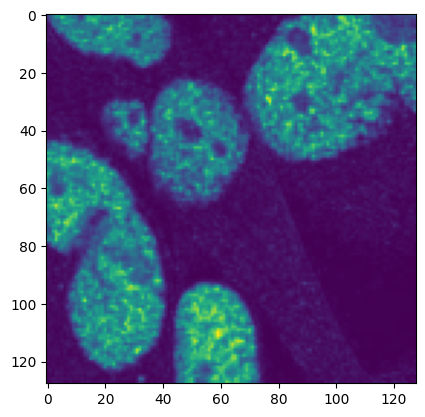

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


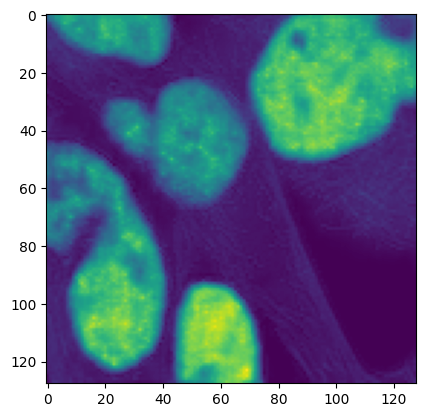

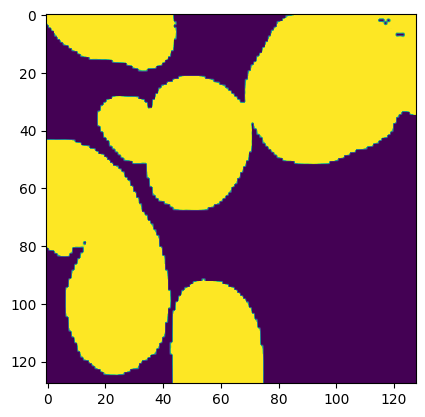

2


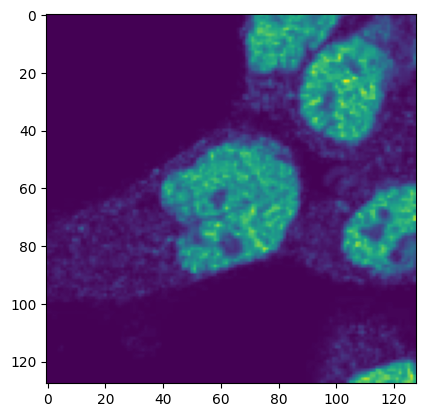

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


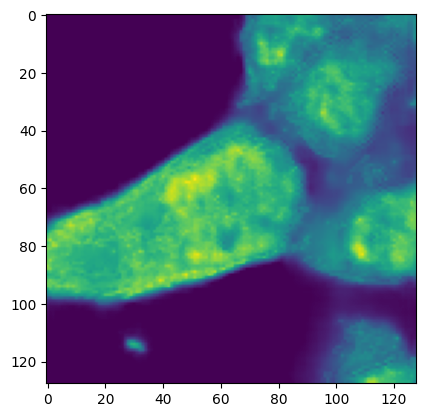

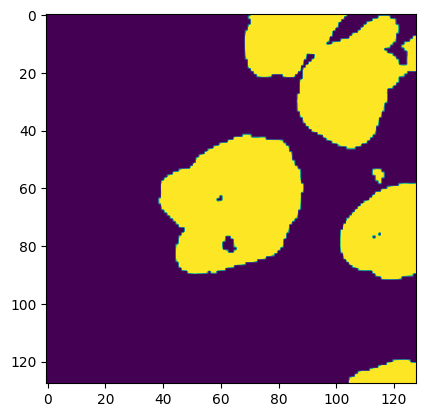

3


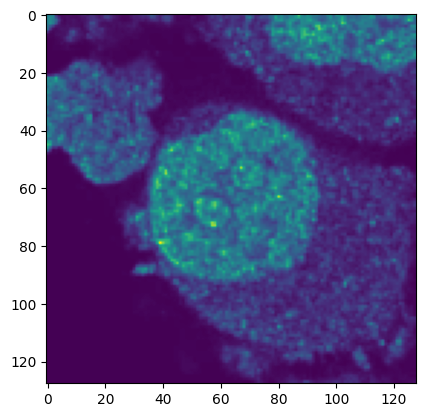

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


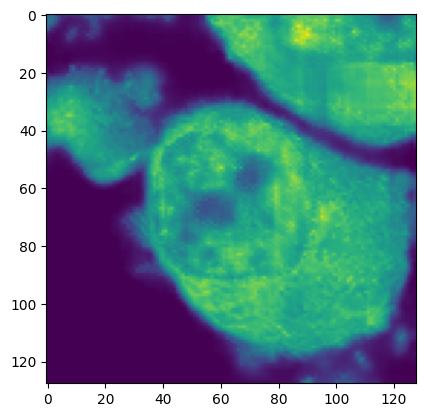

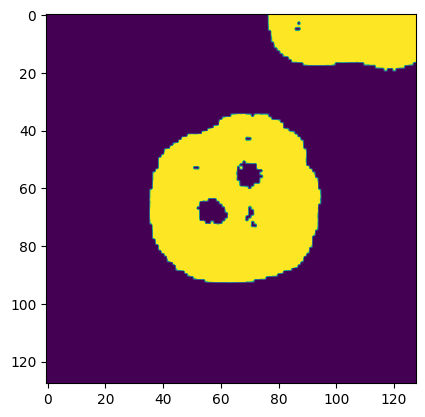

4


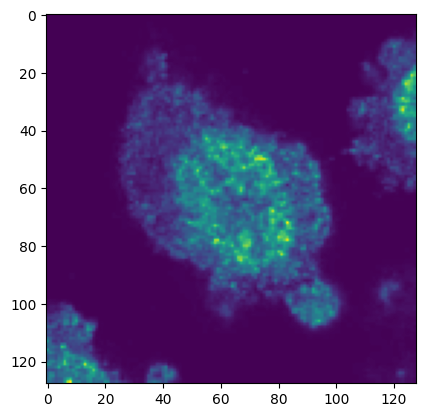

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


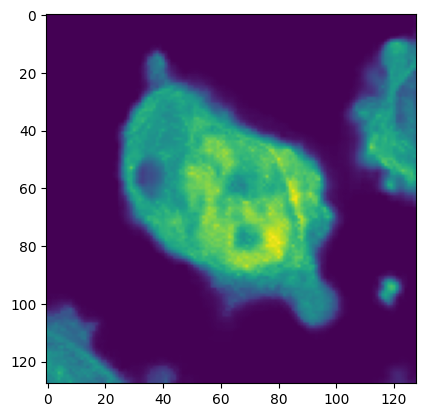

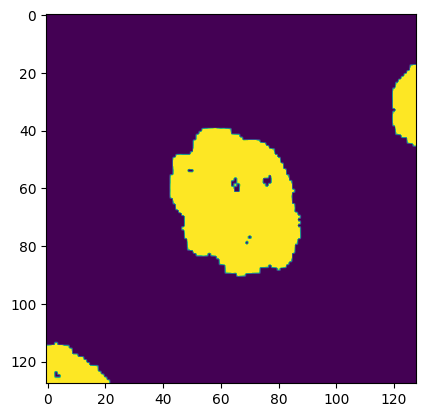

5


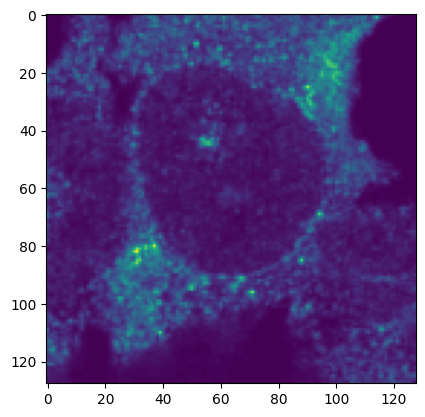

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


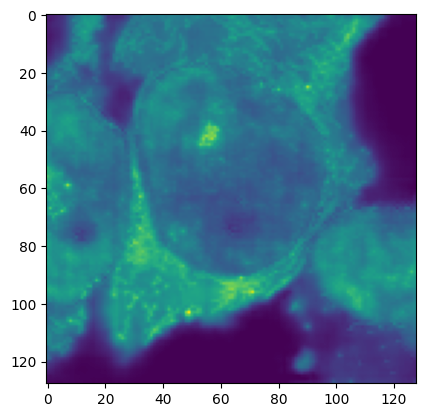

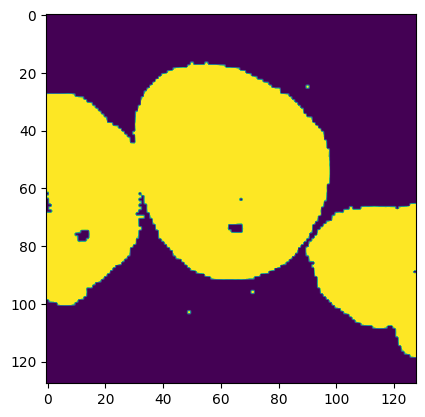

6


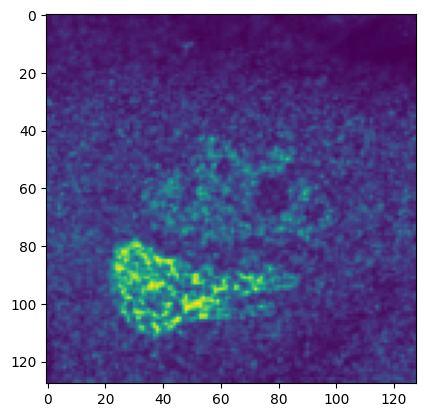

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


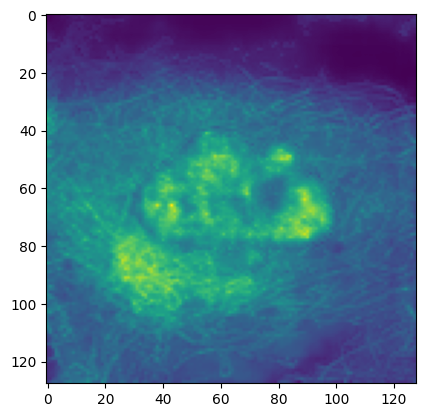

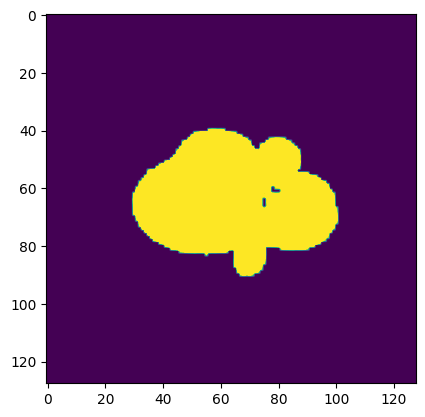

7


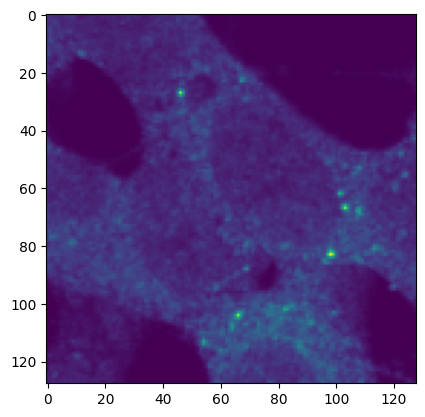

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


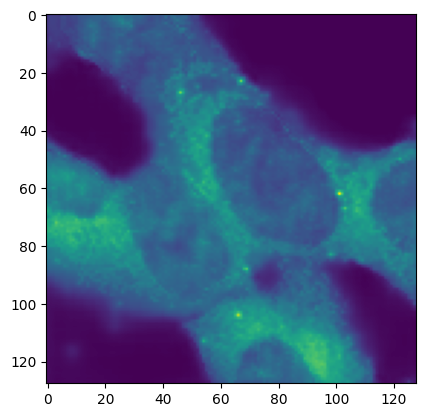

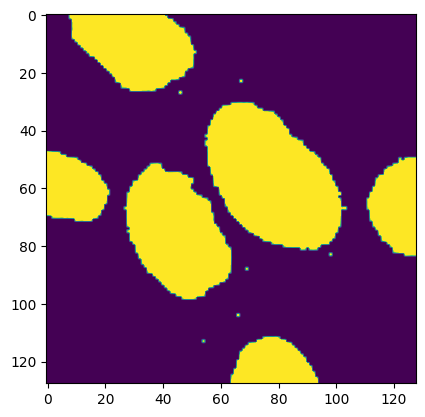

8


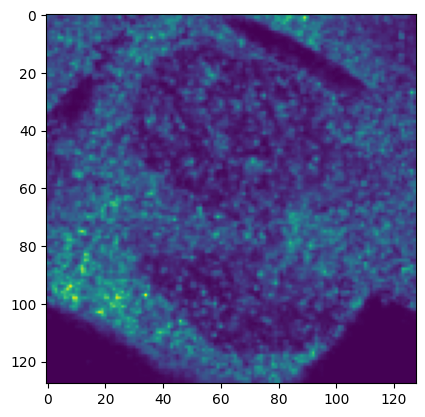

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


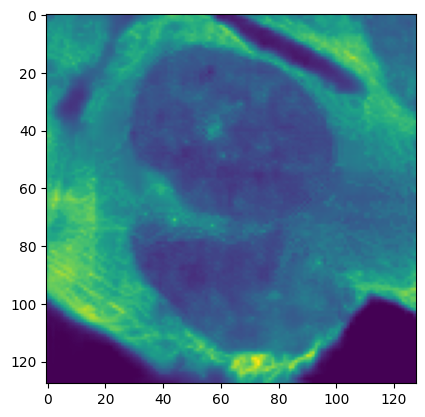

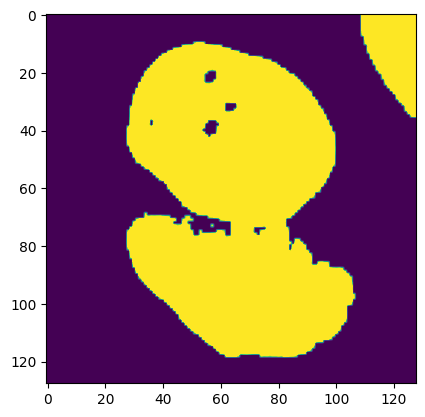

9


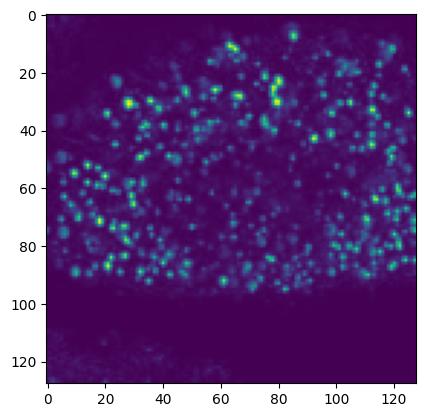

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


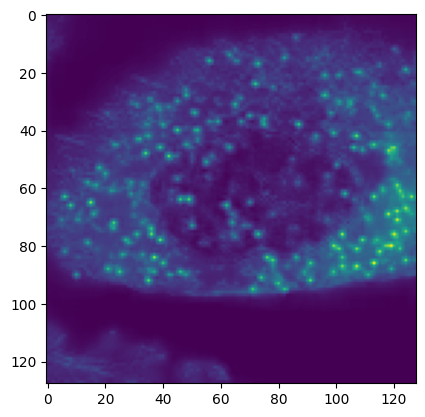

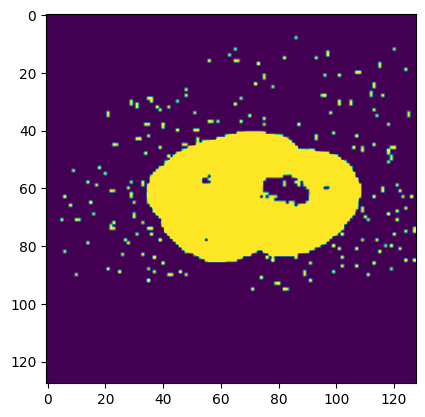

10


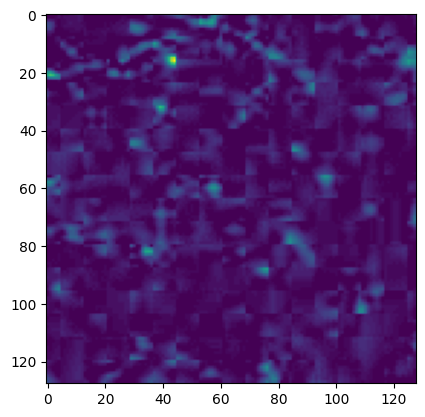

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


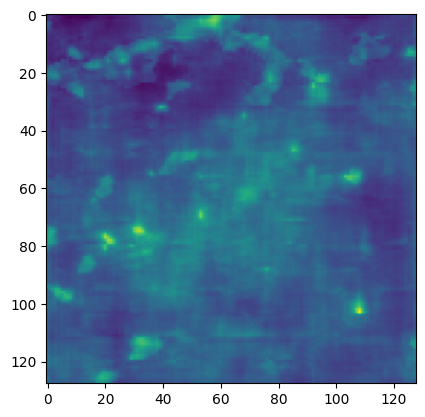

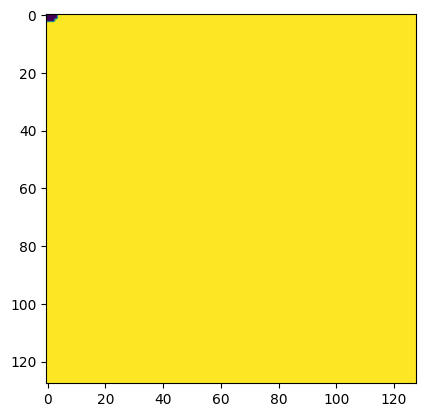

11


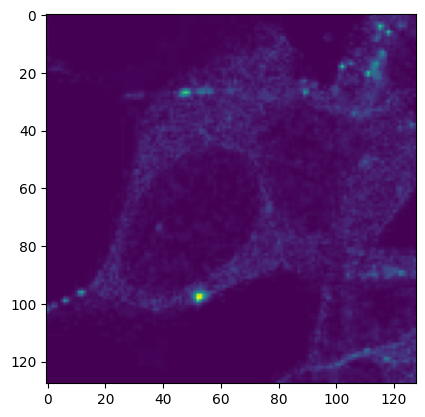

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


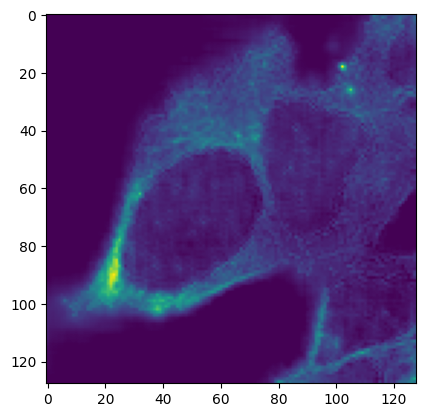

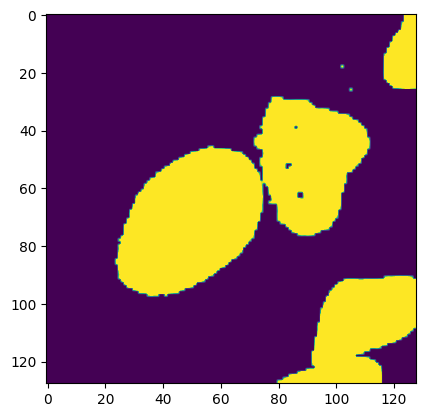

12


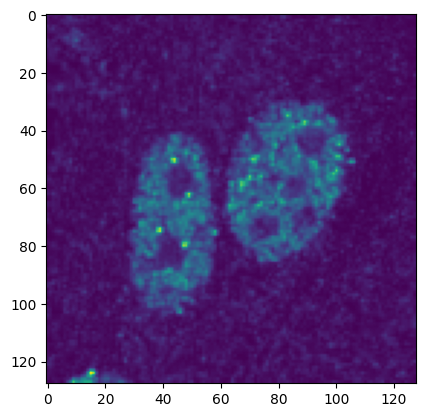

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


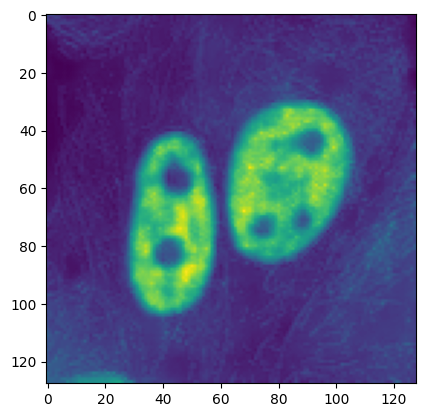

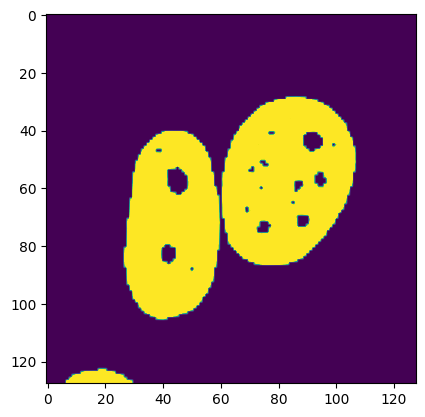

13


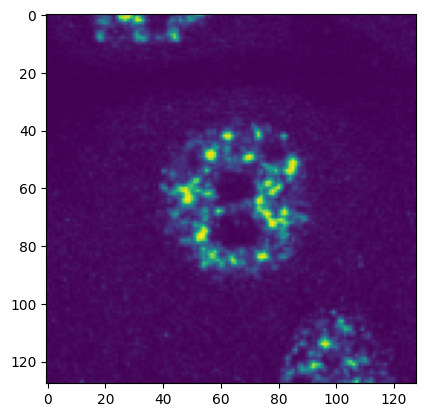

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


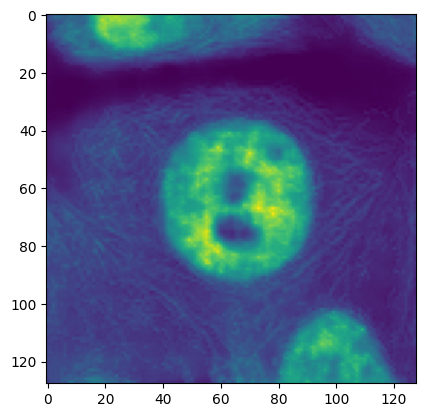

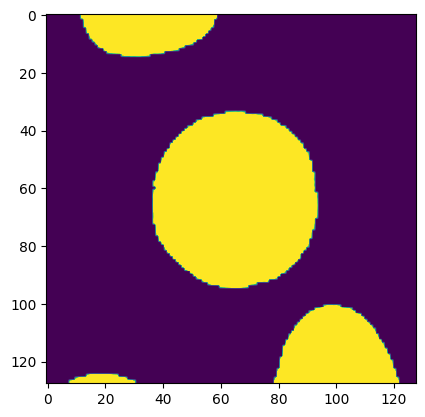

14


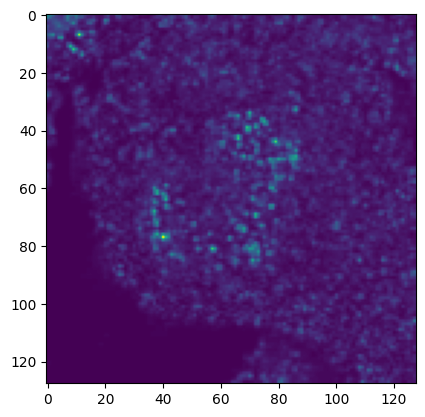

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


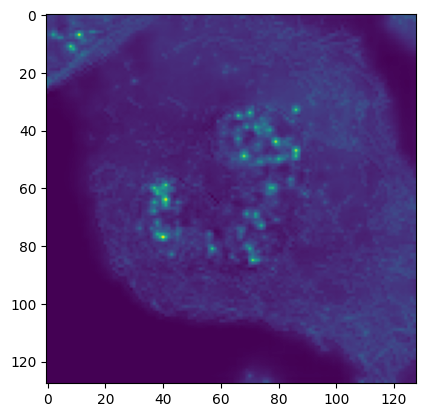

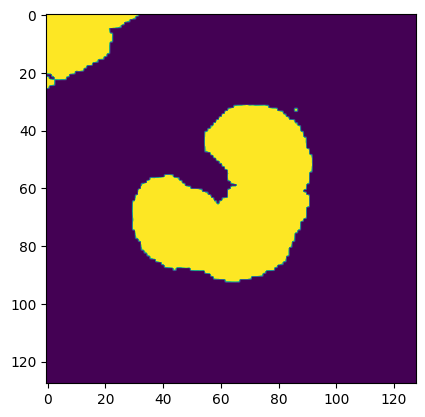

15


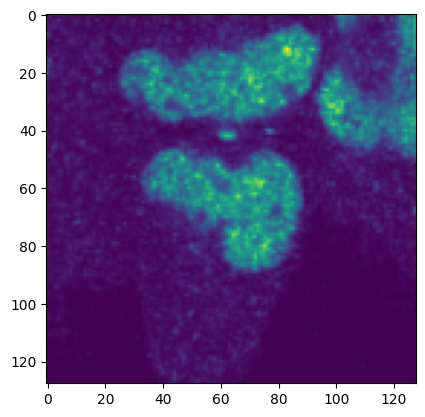

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


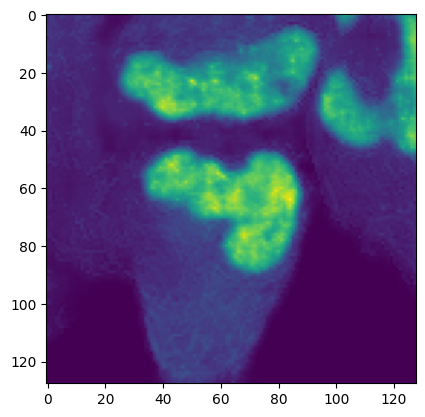

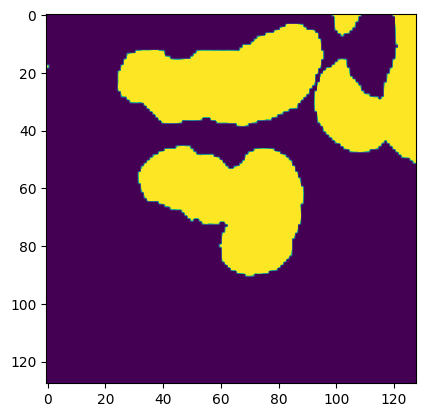

16


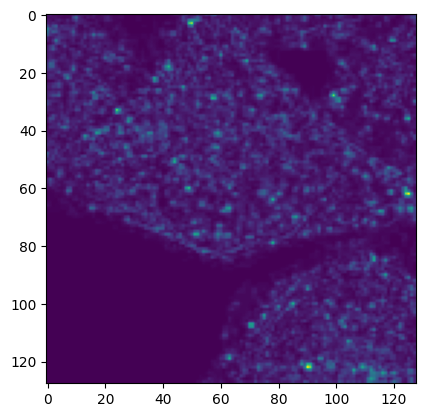

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


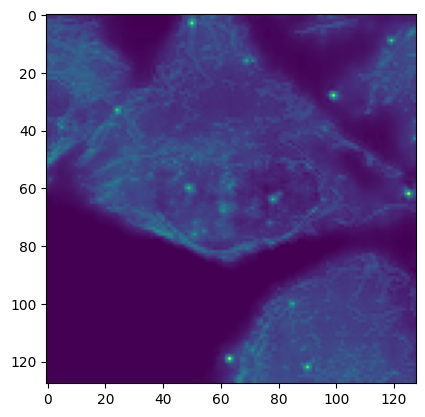

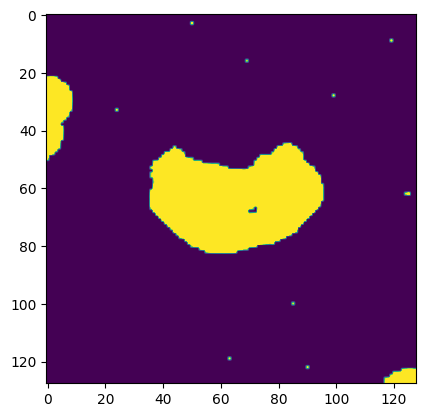

17


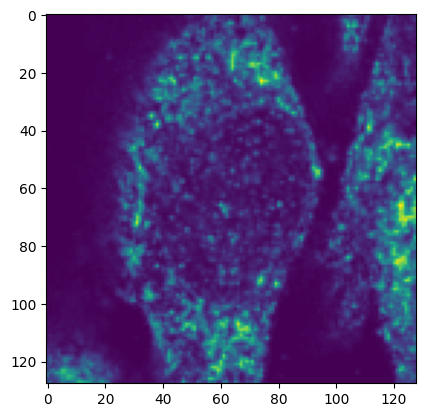

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


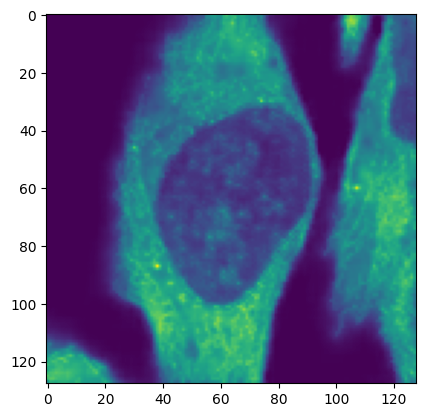

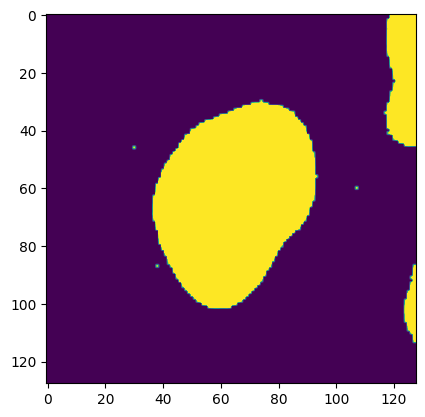

18


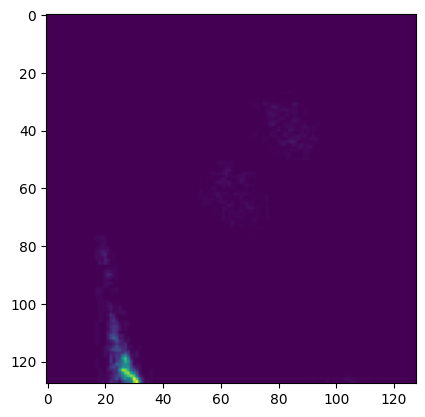

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


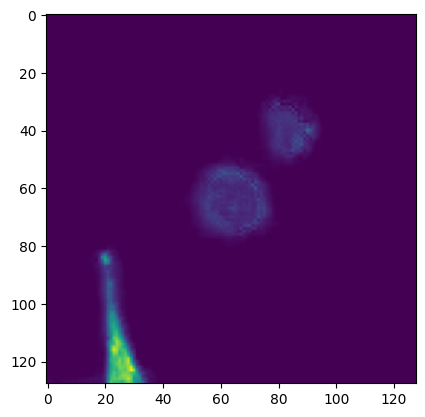

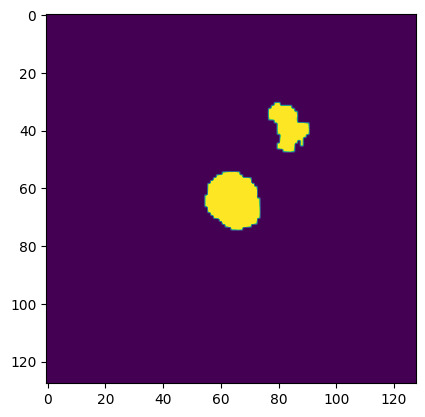

19


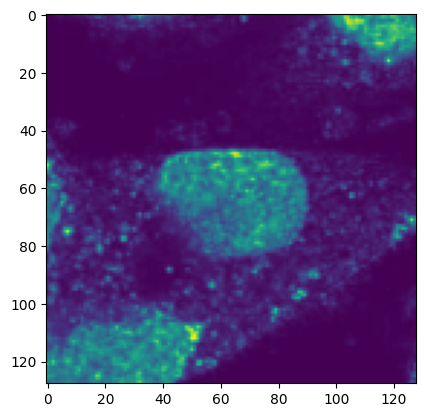

/tmp/ipykernel_2660516/2398611854.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))


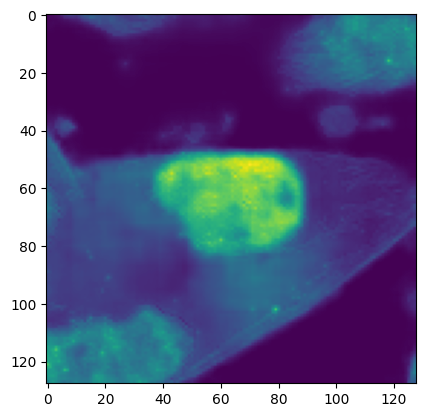

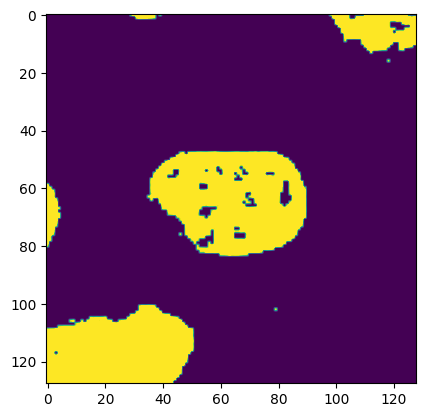

In [36]:
#later epoch
for i in range(20):
    print(i)
    X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[i]
    plt.imshow(y_antibody_stain)
    plt.show()
    with torch.no_grad():
        y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
            (
                X_esm2_encoding.unsqueeze(0),
                torch.Tensor([X_protein_len]),
                torch.from_numpy(X_landmark_stains).unsqueeze(0),
                None,
                None,
            ),
            batch_idx=0,
        )
    plt.imshow(sigmoid(torch.tensor(y_pred_antibody_stain[0][0])))
    plt.show()
    plt.imshow(X_landmark_stains[0],vmax=0.2)
    plt.show()

## compute test loss by cell line & plot examples

In [7]:
savedir='losses'
if not os.path.exists(savedir):
    os.mkdir(savedir)

In [8]:
test_dataset.len

25502

In [9]:
allTestLosses_mse={}
allTestLosses_mseEven={}
allTestPnames={}
allTestCellID={}
allTestCounts={}
allTestCellLine={}
for loc in np.array(sorted(CLASSES[0])):
    allTestLosses_mse[loc]=np.zeros(test_dataset.len)+np.inf
    allTestLosses_mseEven[loc]=np.zeros(test_dataset.len)+np.inf
    allTestPnames[loc]=np.zeros(test_dataset.len).astype(str)
    allTestCellID[loc]=np.zeros(test_dataset.len).astype(str)
    allTestCounts[loc]=0
    allTestCellLine[loc]=np.zeros(test_dataset.len).astype(str)
for i in range(test_dataset.len):
    if i%100==0:
        print(i)
    metadata=get_data('test_'+str(i), Retrieval_Data.METADATA)
    cl=metadata['cell_line']
    X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[i]
    y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
        (
            X_esm2_encoding.unsqueeze(0),
            torch.Tensor([X_protein_len]),
            torch.from_numpy(X_landmark_stains).unsqueeze(0),
            None,
            None,
        ),
        batch_idx=0,
    )
    mse_curr=lossMSE(y_pred_antibody_stain,torch.tensor(y_antibody_stain.reshape(1,1,128,128))).detach().numpy()
    
    y_predminmax=(y_pred_antibody_stain-torch.min(y_pred_antibody_stain))/(torch.max(y_pred_antibody_stain)-torch.min(y_pred_antibody_stain))
    
    
    locs=np.array(sorted(CLASSES[0]))[y_multilabel.astype(bool)]
    
    refMask=np.sum(X_landmark_stains,axis=0)>0
    refMask[refMask]=np.mean(y_pred_antibody_stain.detach().numpy())
    mse_even=lossMSE(torch.tensor(refMask.reshape(1,1,128,128)),torch.tensor(y_antibody_stain.reshape(1,1,128,128))).detach().numpy()

    
    for loc in locs:
        cCount=allTestCounts[loc]
        allTestLosses_mse[loc][cCount]=mse_curr
        allTestLosses_mseEven[loc][cCount]=mse_even
        allTestPnames[loc][cCount]=metadata['splice_isoform_id']
        allTestCellID[loc][cCount]='test_'+str(i)
        allTestCellLine[loc][cCount]=cl
        allTestCounts[loc]+=1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18500
18600
18700
18800
18900
19000
19100
19200
19300
194

In [10]:
import seaborn as sns

In [11]:
for loc in np.array(sorted(CLASSES[0])):
    if allTestCounts[loc]==0:
        continue
    print(loc)
    allTestLosses_mse[loc]=allTestLosses_mse[loc][:allTestCounts[loc]]
    allTestLosses_mseEven[loc]=allTestLosses_mseEven[loc][:allTestCounts[loc]]
    allTestLosses_bce[loc]=allTestLosses_bce[loc][:allTestCounts[loc]]
    allTestPnames[loc]=allTestPnames[loc][:allTestCounts[loc]]
    allTestCellID[loc]=allTestCellID[loc][:allTestCounts[loc]]
    
allTestLoc=np.array([])
allTestLosses_mse_comb=np.array([])
allTestLosses_mseEven_comb=np.array([])
allTestLosses_bce_comb=np.array([])
for loc in np.array(sorted(CLASSES[0])):
    if allTestCounts[loc]==0:
        continue
    allTestLoc=np.concatenate((allTestLoc,np.repeat(loc,allTestCounts[loc])))
    allTestLosses_mse_comb=np.concatenate((allTestLosses_mse_comb,allTestLosses_mse[loc]))
    allTestLosses_mseEven_comb=np.concatenate((allTestLosses_mseEven_comb,allTestLosses_mseEven[loc]))
    allTestLosses_bce_comb=np.concatenate((allTestLosses_bce_comb,allTestLosses_bce[loc]))

Actin filaments
Aggresome
Cell Junctions
Centriolar satellite
Centrosome
Cytokinetic bridge
Cytoplasmic bodies
Cytosol
Endoplasmic reticulum
Focal adhesion sites
Golgi apparatus
Intermediate filaments
Microtubules
Midbody
Mitochondria
Mitotic chromosome
Nuclear bodies
Nuclear membrane
Nuclear speckles
Nucleoli
Nucleoli fibrillar center
Nucleoli rim
Nucleoplasm
Plasma membrane
Vesicles


In [15]:
allTestLosses_mseEven_mean=[]
for loc in np.array(sorted(CLASSES[0])):
    if allTestCounts[loc]==0:
        continue
    allTestLosses_mseEven_mean.append(np.mean(allTestLosses_mseEven[loc]))

In [14]:
np.median(allTestLosses_mse_comb)

0.007054599933326244

In [16]:
np.median(allTestLosses_mseEven_mean)

0.4077308179799074

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


(0.0, 0.8)

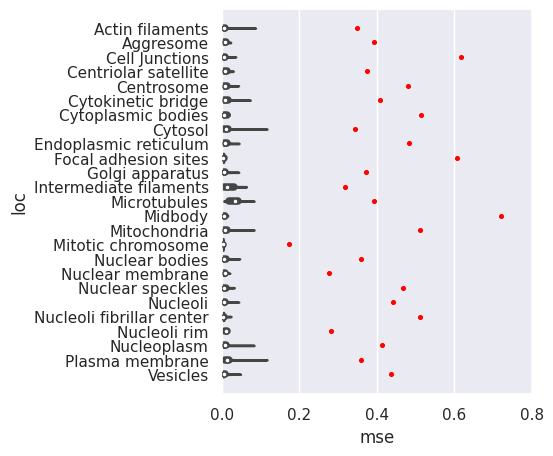

In [33]:
plt.figure(figsize=(4,5))
df=pd.DataFrame(data={'loc':allTestLoc,'mse':allTestLosses_mse_comb})
sns.set(font_scale = 1)
ax=sns.violinplot(df,x='mse',y='loc',cut=0,linewidth=1.8)
ax.scatter(x=allTestLosses_mseEven_mean,y=np.arange(len(allTestLosses_mseEven_mean)),c='red',s=7)
ax.set_xlim(0,0.8)

## plot nuclear localization

In [8]:
from stardist.models import StarDist2D
from csbdeep.utils import normalize
from skimage.filters import gaussian
from skimage.measure import label
from skimage.segmentation import clear_border
from skimage.morphology import remove_small_objects, remove_small_holes
from scipy.ndimage.measurements import center_of_mass

2508730219.py (7): Please use `center_of_mass` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.


In [9]:
model_stardist = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


2024-05-12 19:47:29.584049: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-12 19:47:29.586899: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


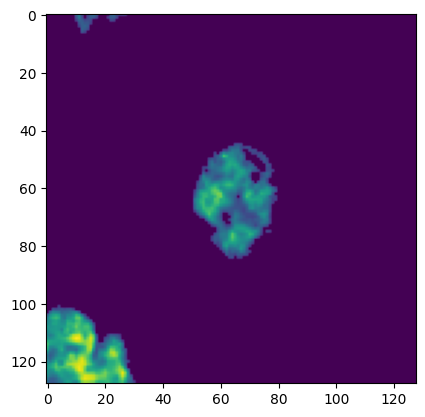

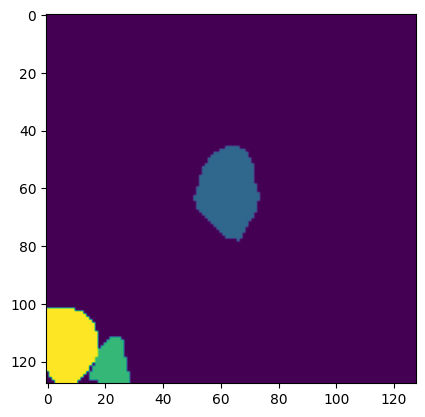

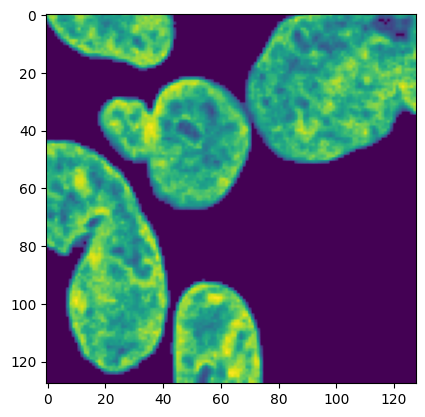

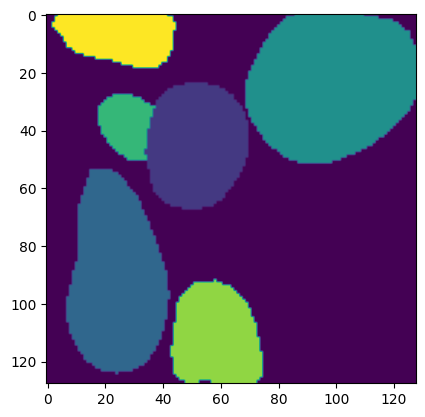

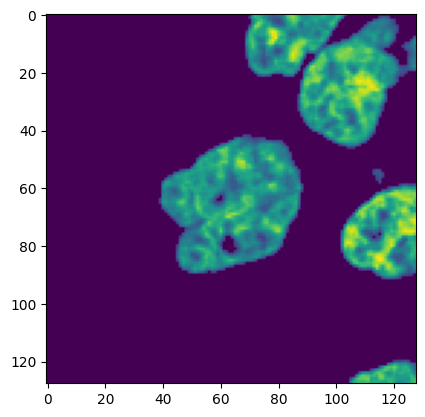

...

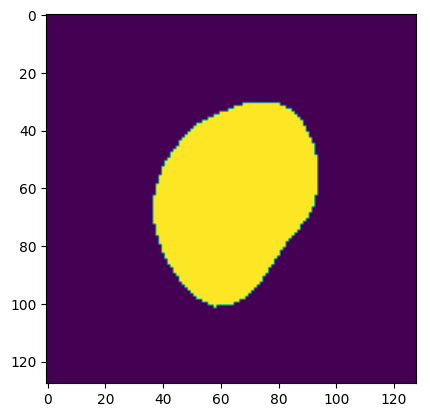

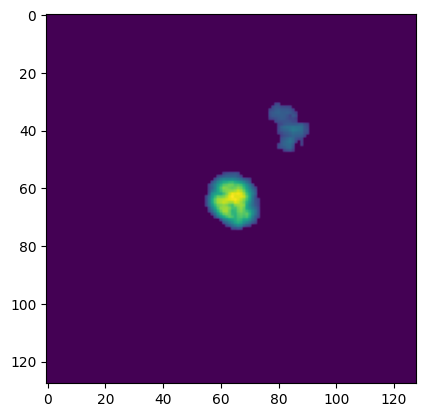

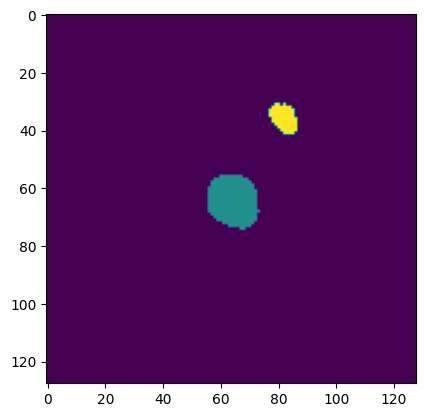

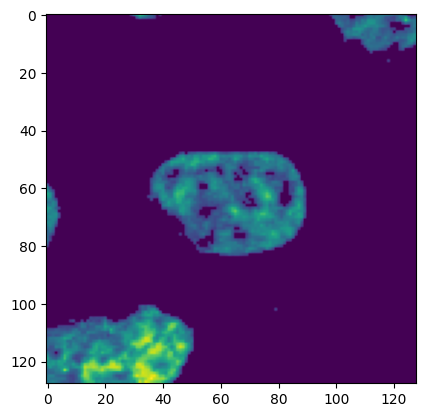

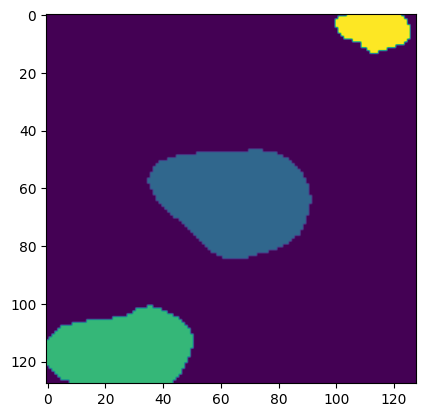

In [138]:
for i in range(20):
    X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[i]
    plt.imshow(X_landmark_stains[0])
    plt.show()
    labeled_nuclei, linfo = model_stardist.predict_instances(gaussian(normalize(X_landmark_stains[0])))
    plt.imshow(labeled_nuclei)
    plt.show()

In [15]:
allTestNucProp_pred=np.zeros(test_dataset.len)
allTestNucProp_true=np.zeros(test_dataset.len)
allTestPnames=np.zeros(test_dataset.len).astype(str)
allTestCL=np.zeros(test_dataset.len).astype(str)
for i in range(test_dataset.len):
    X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[i]
    y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
        (
            X_esm2_encoding.unsqueeze(0),
            torch.Tensor([X_protein_len]),
            torch.from_numpy(X_landmark_stains).unsqueeze(0),
            None,
            None,
        ),
        batch_idx=0,
    )
    labeled_nuclei, linfo = model_stardist.predict_instances(gaussian(normalize(X_landmark_stains[0])))
    nuc_mask=np.zeros((128,128))
    nuc_mask[labeled_nuclei>0]=1
    
    allTestNucProp_pred[i]=np.sum(nuc_mask*y_pred_antibody_stain.detach().numpy())/np.sum(y_pred_antibody_stain.detach().numpy())
    allTestNucProp_true[i]=np.sum(nuc_mask*y_antibody_stain)/np.sum(y_antibody_stain)
    
    metadata=get_data('test_'+str(i), Retrieval_Data.METADATA)
    allTestPnames[i]=metadata['splice_isoform_id']
    allTestCL[i]=metadata['cell_line']

    if i%100==0:
        print(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18500
18600
18700
18800
18

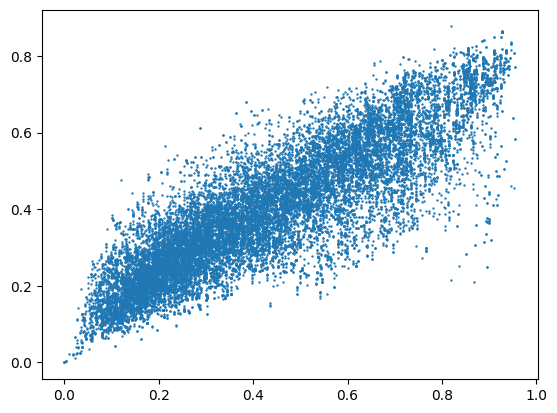

In [147]:
plt.scatter(allTestNucProp_true,allTestNucProp_pred,s=0.5)

In [22]:
from scipy import stats

In [151]:
corr,pval=stats.pearsonr(allTestNucProp_true,allTestNucProp_pred)
print(corr)
print(pval)

0.8778892678916311
0.0


In [23]:
pnames,pcounts=np.unique(allTestPnames,return_counts=True)
pvar_pred=np.zeros(pnames.size)
pmean_pred=np.zeros(pnames.size)
pvar_true=np.zeros(pnames.size)
pmean_true=np.zeros(pnames.size)
perror=np.zeros(pnames.size)
allError_nuc=allTestNucProp_pred-allTestNucProp_true
for p in range(pnames.size):
    pvar_pred[p]=np.var(allTestNucProp_pred[allTestPnames==pnames[p]])
    pvar_true[p]=np.var(allTestNucProp_true[allTestPnames==pnames[p]])
    
    pmean_pred[p]=np.mean(allTestNucProp_pred[allTestPnames==pnames[p]])
    pmean_true[p]=np.mean(allTestNucProp_true[allTestPnames==pnames[p]])
    
    perror[p]=np.mean(np.abs(allError_nuc[allTestPnames==pnames[p]]))

In [24]:
#top pair ranked by std-error
p_cl_pair=np.copy(allTestPnames)
for p in range(p_cl_pair.size):
    p_cl_pair[p]=p_cl_pair[p]+'_'+allTestCL[p].lower()

In [25]:
pclnames,pcounts=np.unique(p_cl_pair,return_counts=True)
pclvar_pred=np.zeros(pclnames.size)
pclmean_pred=np.zeros(pclnames.size)
pclvar_true=np.zeros(pclnames.size)
pclmean_true=np.zeros(pclnames.size)
pclerror=np.zeros(pclnames.size)
allError_nuc=allTestNucProp_pred-allTestNucProp_true
for p in range(pclnames.size):
    pclvar_pred[p]=np.var(allTestNucProp_pred[p_cl_pair==pclnames[p]])
    pclvar_true[p]=np.var(allTestNucProp_true[p_cl_pair==pclnames[p]])
    
    pclmean_pred[p]=np.mean(allTestNucProp_pred[p_cl_pair==pclnames[p]])
    pclmean_true[p]=np.mean(allTestNucProp_true[p_cl_pair==pclnames[p]])
    
    pclerror[p]=np.mean(np.abs(allError_nuc[p_cl_pair==pclnames[p]]))

In [26]:
top_var_idx=np.argsort(-pclvar_pred)
top_var_idx_true=np.argsort(-pclvar_true)
top_var_idx_errorSub=np.argsort(-(np.sqrt(pclvar_pred)-pclerror))
nplot=60
topPairs_pred=pclnames[top_var_idx[:nplot]]
topPairs_true=pclnames[top_var_idx_true[:nplot]]
topPairs_pred_errorSub=pclnames[top_var_idx_errorSub[:nplot]]

In [28]:
#consensus curve
consensusCount=np.zeros(500)
for nplot_i in range(1,500):
    topPairs_pred=pclnames[top_var_idx[:nplot_i]]
    topPairs_true=pclnames[top_var_idx_true[:nplot_i]]
    consensusCount[nplot_i]=np.intersect1d(topPairs_pred,topPairs_true).size/nplot_i

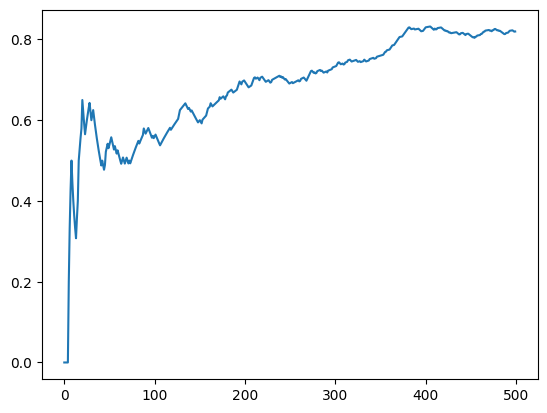

In [29]:
plt.plot(np.arange(500),consensusCount)

In [13]:
topPairs_pred_idx=np.repeat(False,allTestNucProp_pred.size)
for p in topPairs_pred:
    topPairs_pred_idx[p_cl_pair==p]=True

In [14]:
pltorder,pltorderindex=np.unique(p_cl_pair[topPairs_pred_idx],return_index=True)

In [23]:
errorIdx=np.zeros(60).astype(int)
for i in range(60):
    errorIdx[i]=np.arange(pclnames.size)[pclnames==pltorder[np.argsort(pltorderindex)][i]]

In [280]:
savedir_cl='losses/allTest/topVarNucProp'
if not os.path.exists(savedir_cl):
    os.mkdir(savedir_cl)
nExamples=10
percentiles=[(0,33),(33,66),(66,100)]
for p in topPairs_pred:
    print(p)
    pidx=np.arange(p_cl_pair.size)[p_cl_pair==p]
    curr_prop=allTestNucProp_pred[pidx]
    
    
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    plotExample_nuc=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    for std_i in range(len(percentiles)):
        imgIdx=np.logical_and(curr_prop<np.percentile(curr_prop,percentiles[std_i][1]),curr_prop>np.percentile(curr_prop,percentiles[std_i][0]))
        imgIdx=pidx[imgIdx]
        np.random.seed(3)
        np.random.shuffle(imgIdx)
        plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
        for plotIdx_idx in range(plotIdx.size):
            X_esm2_encoding, X_protein_len, X_landmark_stains, y_multilabel, y_antibody_stain=test_dataset[plotIdx[plotIdx_idx]]
            y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
                (
                    X_esm2_encoding.unsqueeze(0),
                    torch.Tensor([X_protein_len]),
                    torch.from_numpy(X_landmark_stains).unsqueeze(0),
                    None,
                    None,
                ),
                batch_idx=0,
            )
            plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,std_i*(imgSize+2):std_i*(imgSize+2)+imgSize]=y_pred_antibody_stain.detach().numpy()
            plotExample_nuc[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,std_i*(imgSize+2):std_i*(imgSize+2)+imgSize]=X_landmark_stains[0]

    plt.imsave(os.path.join(savedir_cl,p+'.jpg'),plotExample)
    plt.imsave(os.path.join(savedir_cl,p+'_nuc.jpg'),plotExample_nuc)

AARS2-201_mcf7
DLL3-201_shsy5y
CABLES1-208_pc3
FAM90A1-201_mcf7
FAM90A1-203_mcf7
CABLES1-201_pc3
FAM90A10P-201_mcf7
FAM90A7P-203_mcf7
A4GALT-201_mcf7
A4GALT-202_mcf7
A4GALT-203_mcf7
A4GALT-206_mcf7
FAM90A18P-201_mcf7
ABCA4-201_mcf7
DRGX-201_rh30
C11orf71-201_mcf7
FZD7-201_bj[humanfibroblast]
C11orf71-202_mcf7
AP002495.1-206_rh30
AP002495.1-204_rh30
EGLN3-201_rh30
CTNNBIP1-201_shsy5y
DDX20-209_rh30
DDX20-201_rh30
BCL7B-201_mcf7
DDIT3-203_pc3
BCL7B-202_mcf7
DDX20-216_rh30
EGLN3-209_rh30
BCL7B-206_mcf7
CDCA4-201_pc3
C16orf71-201_mcf7
C16orf71-204_mcf7
DDIT3-202_pc3
DDIT3-201_pc3
DDIT3-206_pc3
DDIT3-205_pc3
DDIT3-204_pc3
C16orf71-203_mcf7
BTBD7-201_rh30
BTBD7-202_rh30
BIN2-205_hel
BTBD7-208_rh30
BTBD10-201_mcf7
AP002495.1-207_rh30
AP002495.1-205_rh30
BTBD10-210_mcf7
CENPT-208_mcf7
CENPT-202_mcf7
FAM133A-202_mcf7
FAM133A-201_mcf7
DOK7-206_mcf7
EMC6-202_pc3
EMC6-201_pc3
CENPI-201_rh30
DSEL-201_rh30
CENPI-204_rh30
CENPI-202_rh30
CXorf56-204_pc3
CETN1-201_pc3


In [26]:
nplot=50
currTopPairs=np.repeat('-',nplot).astype(object)
currTopPairs_predNames=np.repeat('-',nplot).astype(object)
topPairs_pred_idx_unique=np.repeat(False,allTestNucProp_pred.size)
_count=0
for pidx in range(top_var_idx.size):
    p=pclnames[top_var_idx[pidx]]
    if p.split('-')[0] not in currTopPairs:
        currTopPairs[_count]=p.split('-')[0]
        currTopPairs_predNames[_count]=p
        topPairs_pred_idx_unique[p_cl_pair==p]=True
        _count+=1
    if _count==nplot:
        break

In [27]:
nplot=50
currTopPairs_true=np.repeat('-',nplot).astype(object)
currTopPairs_trueNames=np.repeat('-',nplot).astype(object)
topPairs_true_idx_unique=np.repeat(False,allTestNucProp_pred.size)
_count=0
for pidx in range(top_var_idx.size):
    p=pclnames[top_var_idx_true[pidx]]
    if p.split('-')[0] not in currTopPairs_true:
        currTopPairs_true[_count]=p.split('-')[0]
        currTopPairs_trueNames[_count]=p
        topPairs_true_idx_unique[p_cl_pair==p]=True
        _count+=1
    if _count==nplot:
        break

In [28]:
top2plot,plotPredIdx,plotTrueIdx=np.intersect1d(currTopPairs,currTopPairs_true,return_indices=True)

In [32]:
pltorder_unique,pltorderindex_unique=np.unique(p_cl_pair[topPairs_pred_idx_unique],return_index=True)
errorIdx_unique=np.zeros(pltorderindex_unique.size).astype(int)
for i in range(pltorderindex_unique.size):
    errorIdx_unique[i]=np.arange(pclnames.size)[pclnames==pltorder_unique[np.argsort(pltorderindex_unique)][i]]

In [91]:
savedir_log='losses/log'
with open(os.path.join(savedir_log,'currTopPairs'), 'wb') as output:
    pk.dump(currTopPairs, output, pk.HIGHEST_PROTOCOL)
with open(os.path.join(savedir_log,'currTopPairs_true'), 'wb') as output:
    pk.dump(currTopPairs_true, output, pk.HIGHEST_PROTOCOL)

(0.0, 1.0)

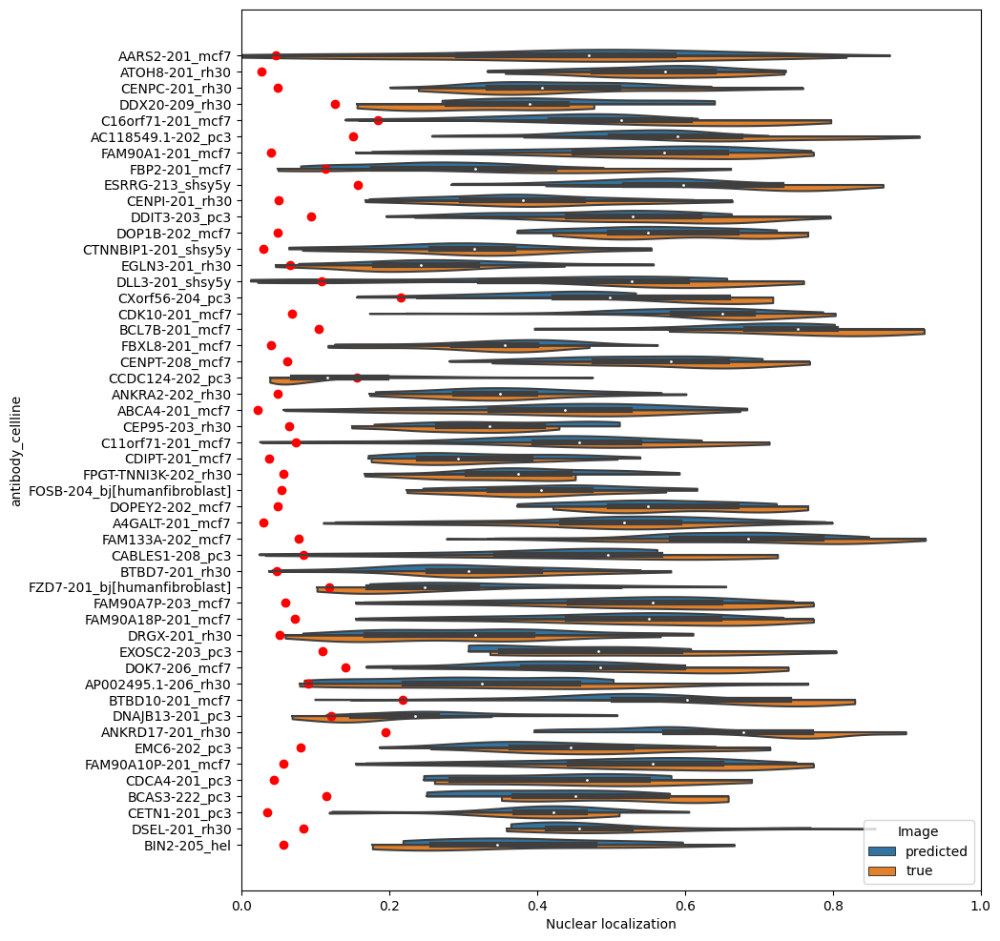

In [40]:
top_var_idx=np.argsort(-pclvar_pred)
top_var_idx_true=np.argsort(-pclvar_true)
nplot=60
topPairs_pred=pclnames[top_var_idx[:nplot]]
topPairs_true=pclnames[top_var_idx_true[:nplot]]
topPairs_pred=pclnames[top_var_idx[:nplot]]

topPairs_pred_idx=np.repeat(False,allTestNucProp_pred.size)
for p in topPairs_pred:
    topPairs_pred_idx[p_cl_pair==p]=True
    
pltorder,pltorderindex=np.unique(p_cl_pair[topPairs_pred_idx],return_index=True)
errorIdx=np.zeros(60).astype(int)
for i in range(60):
    errorIdx[i]=np.arange(pclnames.size)[pclnames==pltorder[np.argsort(pltorderindex)][i]]

nplot =50    
currTopPairs=np.repeat('-',nplot).astype(object)
currTopPairs_predNames=np.repeat('-',nplot).astype(object)
topPairs_pred_idx_unique=np.repeat(False,allTestNucProp_pred.size)
_count=0
for pidx in range(top_var_idx.size):
    p=pclnames[top_var_idx[pidx]]
    if p.split('-')[0] not in currTopPairs:
        currTopPairs[_count]=p.split('-')[0]
        currTopPairs_predNames[_count]=p
        topPairs_pred_idx_unique[p_cl_pair==p]=True
        _count+=1
    if _count==nplot:
        break
        
currTopPairs_true=np.repeat('-',nplot).astype(object)
currTopPairs_trueNames=np.repeat('-',nplot).astype(object)
topPairs_true_idx_unique=np.repeat(False,allTestNucProp_pred.size)
_count=0
for pidx in range(top_var_idx.size):
    p=pclnames[top_var_idx_true[pidx]]
    if p.split('-')[0] not in currTopPairs_true:
        currTopPairs_true[_count]=p.split('-')[0]
        currTopPairs_trueNames[_count]=p
        topPairs_true_idx_unique[p_cl_pair==p]=True
        _count+=1
    if _count==nplot:
        break
        
top2plot,plotPredIdx,plotTrueIdx=np.intersect1d(currTopPairs,currTopPairs_true,return_indices=True)

pltorder_unique,pltorderindex_unique=np.unique(p_cl_pair[topPairs_pred_idx_unique],return_index=True)
errorIdx_unique=np.zeros(pltorderindex_unique.size).astype(int)
for i in range(pltorderindex_unique.size):
    errorIdx_unique[i]=np.arange(pclnames.size)[pclnames==pltorder_unique[np.argsort(pltorderindex_unique)][i]]
    


plt.figure(figsize=(10,12))
names=np.concatenate((np.repeat('predicted',np.sum(topPairs_pred_idx_unique)),np.repeat('true',np.sum(topPairs_pred_idx_unique))))
df=pd.DataFrame(data={'antibody_cellline':np.concatenate((p_cl_pair[topPairs_pred_idx_unique],p_cl_pair[topPairs_pred_idx_unique])),'Nuclear localization':np.concatenate((allTestNucProp_pred[topPairs_pred_idx_unique],allTestNucProp_true[topPairs_pred_idx_unique])),'Image':names})
ax=sns.violinplot(df,x='Nuclear localization',y='antibody_cellline',hue='Image',split=True,cut=0)
ax.scatter(x=pclerror[errorIdx_unique],y=np.arange(nplot),c='red')
plt.xlim(0,1)



### variance of cell line mean nuclear localization

In [11]:
testCellLines=np.array(['NB4', 'MCF7', 'THP1', 'U251MG', 'GAMG', 'HeLa', 'A549', 'HEK293'])


In [3]:
from pymongo import MongoClient
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    isoform_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$splice_isoform_id", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )

In [4]:
isoform_grouping_isoforms=[]
for i in isoform_grouping:
    isoform_grouping_isoforms.append(i['_id'])
np.unique(isoform_grouping_isoforms).size

9472

In [5]:
isoform_grouping_genes=[]
for i in isoform_grouping:
    isoform_grouping_genes.append(i['_id'][:-4])
np.unique(isoform_grouping_genes).size

3312

In [13]:
isoform_grouping_train=[]
for i in isoform_grouping:
    if 'train' in i['ids'][0]:
        isoform_grouping_train.append(i['_id'])

In [17]:
len(isoform_grouping_train)

8086

In [18]:
isoform_grouping_gene_train=[]
for i in isoform_grouping:
    if 'train' in i['ids'][0]:
        isoform_grouping_gene_train.append(i['_id'][:-4])
np.unique(isoform_grouping_gene_train).size

2801

In [7]:
with open('isoform_grouping_alphabetical', 'wb') as output:
    pk.dump(isoform_grouping, output, pk.HIGHEST_PROTOCOL)

In [19]:
with open('isoform_grouping_train_alphabetical', 'wb') as output:
    pk.dump(isoform_grouping_train, output, pk.HIGHEST_PROTOCOL)

In [13]:
cell_line_grouping = None
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    cell_line_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$cell_line", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )

In [14]:
trainCL=[]
testCL=[]
evalCL=[]
for i in range(len(cell_line_grouping)):
    if 'train' in cell_line_grouping[i]['ids'][0]:
        trainCL.append(cell_line_grouping[i]['_id'])
    elif 'eval' in cell_line_grouping[i]['ids'][0]:
        evalCL.append(cell_line_grouping[i]['_id'])
    elif 'test' in cell_line_grouping[i]['ids'][0]:
        testCL.append(cell_line_grouping[i]['_id'])
print(np.sort(trainCL))
print(np.sort(evalCL))
print(np.sort(testCL))

['A549' 'AF22' 'ASC52telo' 'ASCTERT1' 'BJ' 'CACO2' 'EFO21' 'GAMG' 'HAP1'
 'HDLM2' 'HEK293' 'HaCaT' 'HepG2' 'JURKAT' 'LHCNM2' 'NB4' 'OE19' 'REH'
 'RPTEC/TERT1' 'RPTECTERT1' 'RT4' 'SKMEL30' 'SiHa' 'SuSa' 'THP1' 'U251MG'
 'U2OS' 'hTCEpi' 'hTERTRPE1(serumstarved)']
['A431' 'HUVECTERT2' 'HeLa' 'K562']
['BJ[Humanfibroblast]' 'HEL' 'HUVEC/TERT2' 'MCF7' 'PC3' 'RH30' 'Rh30'
 'SHSY5Y' 'hTERTRPE1']


In [17]:
cellIDbyCellLine={}
for clidx in cell_line_grouping:
    if clidx['_id'] in testCellLines:
        cellIDbyCellLine[clidx['_id']]=np.array(clidx['ids'])

In [18]:
import time

In [20]:
nucProp_landmarks={}
nucProp_mask={}
nsamples=200
for clidx in range(testCellLines.size):
    cl=testCellLines[clidx]
    print(cl)

    sampleIdx=np.arange(cellIDbyCellLine[cl].size)
    np.random.seed(3)
    np.random.shuffle(sampleIdx)
    cellID_cl=cellIDbyCellLine[cl][sampleIdx[:nsamples]]
    
    nucProp_landmarks[cl]=[None]*nsamples
    nucProp_mask[cl]=[None]*nsamples
    for cIdx in range(nsamples):
        X_landmark_stains = get_data(cellID_cl[cIdx], Retrieval_Data.CELL_IMAGE)
        labeled_nuclei, linfo = model_stardist.predict_instances(gaussian(normalize(X_landmark_stains[0])))
        nuc_mask=np.zeros((128,128))
        nuc_mask[labeled_nuclei>0]=1
        
        
        nucProp_landmarks[cl][cIdx]=X_landmark_stains
        nucProp_mask[cl][cIdx]=nuc_mask
        

NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293


In [ ]:
#threshold
#Fei's cell line
highThresh=2/3
lowThresh=1/3
nucProp_p_cl_thresh=np.zeros((len(isoform_grouping),testCellLines.size))

nsamples=60
for clidx in range(testCellLines.size):
    cl=testCellLines[clidx]
    print(cl)

    for pidx in range(len(isoform_grouping)):
        p=isoform_grouping[pidx]['_id']
        print(p)
        X_esm2_encoding, X_protein_len = get_data(isoform_grouping[pidx]['ids'][0], Retrieval_Data.PROTEIN_SEQ)

        nucPropCurr=np.zeros(nsamples)
        tstart=time.time()
        for cIdx in range(nsamples):
            X_landmark_stains = nucProp_landmarks[cl][cIdx]
            nuc_mask=nucProp_mask[cl][cIdx]
            if cIdx%10==0:
                print(cIdx)

            y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
                (
                    X_esm2_encoding.unsqueeze(0),
                    torch.Tensor([X_protein_len]),
                    torch.from_numpy(X_landmark_stains).unsqueeze(0),
                    None,
                    None,
                ),
                batch_idx=0,
            )
            nucPropRaw=np.sum(nuc_mask*y_pred_antibody_stain.detach().numpy())/np.sum(y_pred_antibody_stain.detach().numpy())
            if nucPropRaw>highThresh:
                nucPropCurr[cIdx]=1
            elif nucPropRaw<lowThresh:
                nucPropCurr[cIdx]=-1
        print(time.time()-tstart)
        nucProp_p_cl_thresh[pidx,clidx]=np.mean(nucPropCurr)

NB4
DKK3-201
0
10
20
30
40
50
1.8763089179992676
DFFB-201
0
10
20
30
40
50
1.8571083545684814
EXOG-201
0
10
20
30
40
50
1.8740227222442627
ELMO3-203
0
10
20
30
40
50
1.8625214099884033
DYSF-203
0
10
20
30
40
50
1.8649678230285645
ADAM17-204
0
10
20
30
40
50
1.8770310878753662
CHURC1-203
0
10
20
30
40
50
1.8820598125457764
AQP1-203
0
10
20
30
40
50
1.8883366584777832
DMBT1-208
0
10
20
30
40
50
1.8741235733032227
AGTRAP-203
0
10
20
30
40
50
1.8840241432189941
ENO1-201
0
10
20
30
40
50
1.8737413883209229
FAM126A-217
0
10
20
30
40
50
1.8834726810455322
FGF12-202
0
10
20
30
40
50
1.87436842918396
C1QTNF7-204
0
10
20
30
40
50
1.8772759437561035
AKR7A2-204
0
10
20
30
40
50
1.8793025016784668
ELOVL1-202
0
10
20
30
40
50
1.8785901069641113
ARHGAP9-213
0
10
20
30
40
50
1.8842766284942627
CEBPG-201
0
10
20
30
40
50
1.8789787292480469
EVA1A-204
0
10
20
30
40
50
1.8787009716033936
DCAF12L1-201
0
10
20
30
40
50
1.8838915824890137
CKLF-204
0
10
20
30
40
50
1.8674061298370361
CYTH2-203
0
10
20
30
40
5

In [ ]:
savedir_log='losses/log/'
with open(os.path.join(savedir_log,'nucProp_p_cl_thresh'), 'wb') as output:
    pk.dump(nucProp_p_cl_thresh, output, pk.HIGHEST_PROTOCOL)


In [54]:
savedir_log='losses/log/'
with open(os.path.join(savedir_log,'nucProp_p_cl_thresh'), 'rb') as output:
    nucProp_p_cl_thresh=pk.load(output)
isoform_grouping_names=np.array([isoform_grouping[pidx]['_id'] for pidx in range(len(isoform_grouping))])


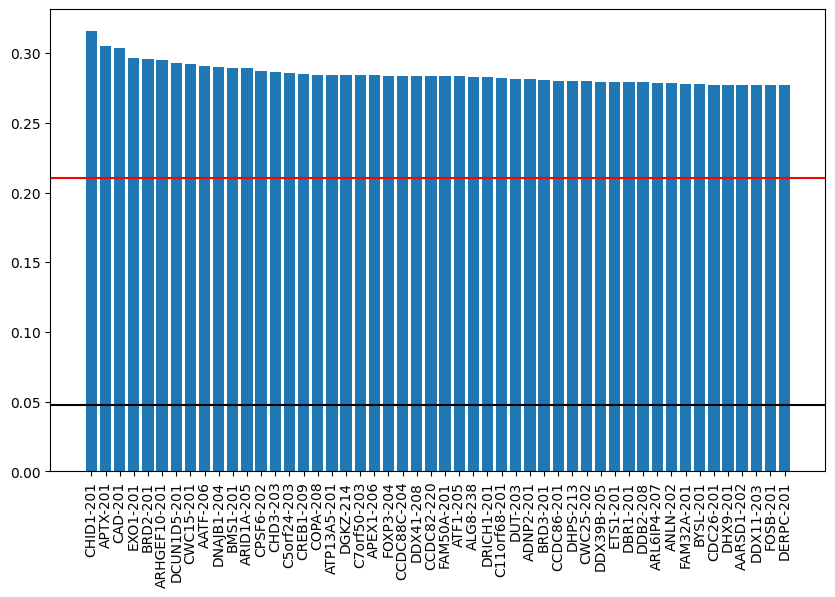

In [120]:
#select isoforms with different prefixes
ntopP=50
rankThreshVarPidx_unique=np.zeros(ntopP).astype(int)
topIsoformNames_unique=np.repeat('-',ntopP).astype(object)
pCount=0
for pidx in range(len(isoform_grouping)):
    pcurr=isoform_grouping_names[rankThreshVarPidx[pidx]]
    pcurr=pcurr.split('-')[0]
    if pcurr not in topIsoformNames_unique:
        topIsoformNames_unique[pCount]=pcurr
        rankThreshVarPidx_unique[pCount]=rankThreshVarPidx[pidx]
        pCount+=1
    if pCount==ntopP:
        break
plt.figure(figsize=(10,6))
plt.bar(np.arange(ntopP),nucProp_p_cl_thresh_var[rankThreshVarPidx_unique])
plt.xticks(np.arange(ntopP), isoform_grouping_names[rankThreshVarPidx_unique], rotation='vertical')
plt.axhline(np.median(nucProp_p_cl_thresh_var),color='r')
plt.axhline(np.min(nucProp_p_cl_thresh_var),color='black')
plt.show()

In [91]:
#plot examples of each cell line with each proteoform
imgSize=128
nExamples=35
savedir_nucPropExamples='plots/nucProp_thresh/'
for pidxCount in range(ntopP):
    pidx=rankThreshVarPidx_unique[pidxCount]
    p=isoform_grouping[pidx]['_id']
    print(p)
    nucProp_imgs=np.zeros((testCellLines.size*(imgSize+2),nExamples*(imgSize+2),3))

    for clidx in range(testCellLines.size):
        cl=testCellLines[clidx]
        print(cl)

        
        X_esm2_encoding, X_protein_len = get_data(isoform_grouping[pidx]['ids'][0], Retrieval_Data.PROTEIN_SEQ)

        for cIdx in range(nExamples):
            X_landmark_stains = nucProp_landmarks[cl][cIdx]
            nuc_mask=nucProp_mask[cl][cIdx]

            y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
                (
                    X_esm2_encoding.unsqueeze(0),
                    torch.Tensor([X_protein_len]),
                    torch.from_numpy(X_landmark_stains).unsqueeze(0),
                    None,
                    None,
                ),
                batch_idx=0,
            )
            y_predMinMax=y_pred_antibody_stain.detach().numpy()
            y_predMinMax=(y_predMinMax-np.min(y_predMinMax))/(np.max(y_predMinMax)-np.min(y_predMinMax))
            nucProp_imgs[clidx*(imgSize+2):clidx*(imgSize+2)+imgSize,cIdx*(imgSize+2):cIdx*(imgSize+2)+imgSize,0]=y_predMinMax
    plt.imsave(os.path.join(savedir_nucPropExamples,p+'_feiCellLine.jpg'),nucProp_imgs)


CHID1-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
APTX-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CAD-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EXO1-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
BRD2-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ARHGEF10-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DCUN1D5-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CWC15-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
AATF-206
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DNAJB1-204
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
BMS1-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ARID1A-205
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CPSF6-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CHD3-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
C5orf24-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CREB1-209
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
COPA-208
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ATP13A5-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DGKZ-214
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549

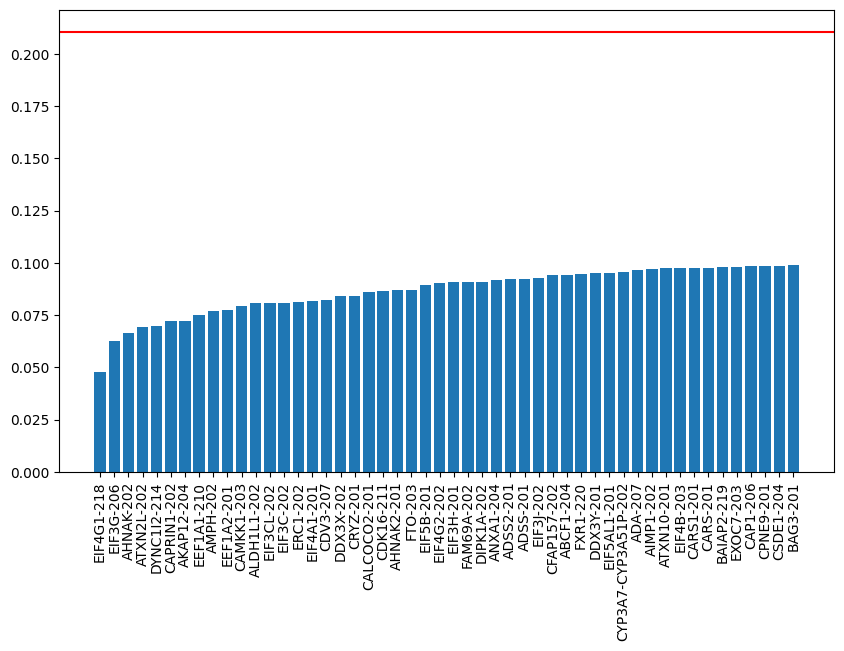

In [97]:
#select isoforms with different prefixes
ntopP=50
rankThreshVarPidx_min_unique=np.zeros(ntopP).astype(int)
topIsoformNames_unique=np.repeat('-',ntopP).astype(object)
pCount=0
for pidx in range(len(isoform_grouping)):
    pcurr=isoform_grouping_names[rankThreshVarPidx_min[pidx]]
    pcurr=pcurr.split('-')[0]
    if pcurr not in topIsoformNames_unique:
        topIsoformNames_unique[pCount]=pcurr
        rankThreshVarPidx_min_unique[pCount]=rankThreshVarPidx_min[pidx]
        pCount+=1
    if pCount==ntopP:
        break
plt.figure(figsize=(10,6))
plt.bar(np.arange(ntopP),nucProp_p_cl_thresh_var[rankThreshVarPidx_min_unique])
plt.xticks(np.arange(ntopP), isoform_grouping_names[rankThreshVarPidx_min_unique], rotation='vertical')
plt.axhline(np.median(nucProp_p_cl_thresh_var),color='r')
plt.show()

In [98]:
#plot examples of each cell line with each proteoform
imgSize=128
nExamples=35
savedir_nucPropExamples='plots/nucProp_thresh/'
for pidxCount in range(ntopP):
    pidx=rankThreshVarPidx_min_unique[pidxCount]
    p=isoform_grouping[pidx]['_id']
    print(p)
    nucProp_imgs=np.zeros((testCellLines.size*(imgSize+2),nExamples*(imgSize+2),3))

    for clidx in range(testCellLines.size):
        cl=testCellLines[clidx]
        print(cl)

        
        X_esm2_encoding, X_protein_len = get_data(isoform_grouping[pidx]['ids'][0], Retrieval_Data.PROTEIN_SEQ)

        for cIdx in range(nExamples):
            X_landmark_stains = nucProp_landmarks[cl][cIdx]
            nuc_mask=nucProp_mask[cl][cIdx]

            y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
                (
                    X_esm2_encoding.unsqueeze(0),
                    torch.Tensor([X_protein_len]),
                    torch.from_numpy(X_landmark_stains).unsqueeze(0),
                    None,
                    None,
                ),
                batch_idx=0,
            )
            y_predMinMax=y_pred_antibody_stain.detach().numpy()
            y_predMinMax=(y_predMinMax-np.min(y_predMinMax))/(np.max(y_predMinMax)-np.min(y_predMinMax))
            nucProp_imgs[clidx*(imgSize+2):clidx*(imgSize+2)+imgSize,cIdx*(imgSize+2):cIdx*(imgSize+2)+imgSize,0]=y_predMinMax
    plt.imsave(os.path.join(savedir_nucPropExamples,p+'_feiCellLine_min.jpg'),nucProp_imgs)


EIF4G1-218
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EIF3G-206
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
AHNAK-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ATXN2L-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DYNC1I2-214
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CAPRIN1-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
AKAP12-204
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EEF1A1-210
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
AMPH-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EEF1A2-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CAMKK1-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ALDH1L1-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EIF3CL-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EIF3C-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ERC1-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EIF4A1-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CDV3-207
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DDX3X-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CRYZ-201
NB4
MCF7
THP1
U251MG
GAMG


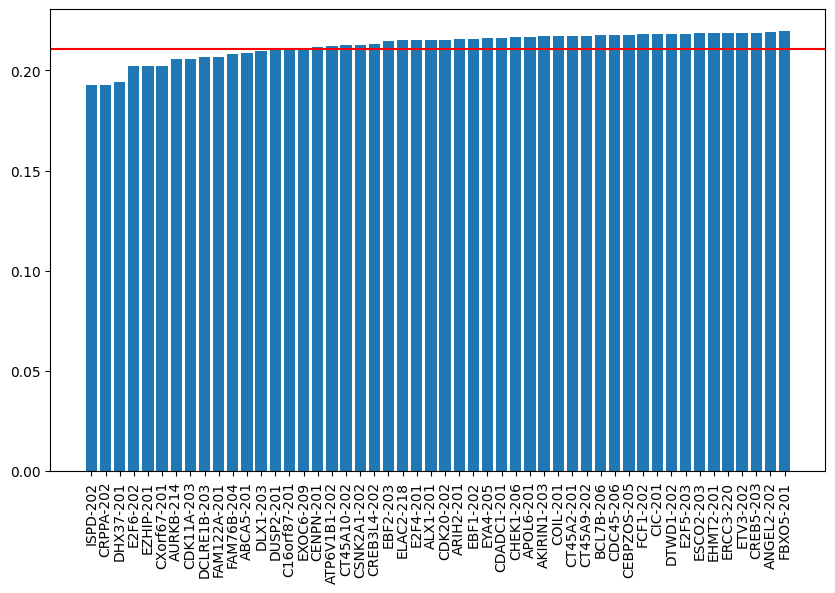

In [57]:
#select isoforms with different prefixes
ntopP=50
rankThreshVarPidx_minIn_unique=np.zeros(ntopP).astype(int)
topIsoformNames_unique=np.repeat('-',ntopP).astype(object)
pCount=0
for pidx in range(np.sum(nucProp_p_cl_thresh_mean>0)):
    pcurr=isoform_grouping_names[nucProp_p_cl_thresh_mean>0][rankThreshVarPidx_minIn[pidx]]
    pcurr=pcurr.split('-')[0]
    if pcurr not in topIsoformNames_unique:
        topIsoformNames_unique[pCount]=pcurr
        rankThreshVarPidx_minIn_unique[pCount]=rankThreshVarPidx_minIn[pidx]
        pCount+=1
    if pCount==ntopP:
        break
plt.figure(figsize=(10,6))
plt.bar(np.arange(50),nucProp_p_cl_thresh_var[nucProp_p_cl_thresh_mean>0][rankThreshVarPidx_minIn_unique[:50]])
plt.xticks(np.arange(50), isoform_grouping_names[nucProp_p_cl_thresh_mean>0][rankThreshVarPidx_minIn_unique[:50]], rotation='vertical')
plt.axhline(np.median(nucProp_p_cl_thresh_var),color='r')
plt.show()

In [63]:
#plot examples of each cell line with each proteoform
imgSize=128
nExamples=35
savedir_nucPropExamples='plots/nucProp_thresh/'
for pidxCount in range(ntopP):
    pidx=rankThreshVarPidx_minIn_unique[pidxCount]
    p=np.array(isoform_grouping)[nucProp_p_cl_thresh_mean>0][pidx]['_id']
    pidx=np.arange(len(isoform_grouping))[nucProp_p_cl_thresh_mean>0][pidx]
    
    print(p)
    nucProp_imgs=np.zeros((testCellLines.size*(imgSize+2),nExamples*(imgSize+2),3))

    for clidx in range(testCellLines.size):
        cl=testCellLines[clidx]
        print(cl)

        
        X_esm2_encoding, X_protein_len = get_data(isoform_grouping[pidx]['ids'][0], Retrieval_Data.PROTEIN_SEQ)

        for cIdx in range(nExamples):
            X_landmark_stains = nucProp_landmarks[cl][cIdx]
            nuc_mask=nucProp_mask[cl][cIdx]

            y_pred_antibody_stain, _y_pred_multilabel, _y_pred_ranked = loaded_model.predict_step(
                (
                    X_esm2_encoding.unsqueeze(0),
                    torch.Tensor([X_protein_len]),
                    torch.from_numpy(X_landmark_stains).unsqueeze(0),
                    None,
                    None,
                ),
                batch_idx=0,
            )
            y_predMinMax=y_pred_antibody_stain.detach().numpy()
            y_predMinMax=(y_predMinMax-np.min(y_predMinMax))/(np.max(y_predMinMax)-np.min(y_predMinMax))
            nucProp_imgs[clidx*(imgSize+2):clidx*(imgSize+2)+imgSize,cIdx*(imgSize+2):cIdx*(imgSize+2)+imgSize,0]=y_predMinMax
    plt.imsave(os.path.join(savedir_nucPropExamples,p+'_feiCellLine_minIn.jpg'),nucProp_imgs)


ISPD-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CRPPA-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DHX37-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
E2F6-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EZHIP-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CXorf67-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
AURKB-214
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CDK11A-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DCLRE1B-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
FAM122A-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
FAM76B-204
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ABCA5-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DLX1-203
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
DUSP2-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
C16orf87-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
EXOC6-209
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CENPN-201
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
ATP6V1B1-202
NB4
MCF7
THP1
U251MG
GAMG
HeLa
A549
HEK293
CT45A10-202
NB4
MCF7
THP1
U251MG
GA